<a href="https://colab.research.google.com/github/JohnalEco/Hurtos_Medellin/blob/main/Hurtos_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Análisis Espacial de Hurtos en Medellín
Este Jupyter Notebook presenta un análisis espacial detallado de los hurtos ocurridos en los barrios de Medellín, Colombia. Utilizando datos geoespaciales y probabilidades bayesianas, se examinan las probabilidades de ser robado en diferentes barrios, considerando diversas categorías de armas y variables demográficas.

# Descripción del Proyecto

El objetivo principal de este análisis es proporcionar una visión clara y detallada de los patrones de criminalidad en Medellín, ayudando a identificar las áreas con mayores riesgos de hurto y los factores que influyen en estos delitos. El análisis incluye:

Carga y Limpieza de Datos: Lectura de los datos de hurtos y geoespaciales, seguido de un proceso de limpieza y filtrado para asegurar la calidad de los datos utilizados.
Análisis Exploratorio: Exploración inicial de los datos para identificar tendencias y patrones generales en los hurtos reportados.
Mapas de Calor: Visualización de la densidad de hurtos en diferentes barrios utilizando mapas de calor interactivos.
Probabilidades de Hurtos por Barrio: Cálculo de las probabilidades de ser robado en cada barrio, considerando diferentes tipos de armas.
Probabilidades Bayesianas: Análisis de las probabilidades de ser robado basado en el sexo (hombre/mujer) de la víctima, utilizando métodos bayesianos.
Visualización de Resultados: Generación de gráficos y mapas para visualizar los resultados del análisis, destacando los barrios con mayor riesgo de hurto y las diferencias en probabilidades según las variables estudiadas.

# Archivos Incluidos



*   hurto_a_persona.csv: Dataset con los registros de hurtos ocurridos en Medellín.
*   BarrioVereda_2014.shp: Archivo shapefile con la delimitación geográfica de los barrios de Medellín.
*   Notebook de Análisis: Este Jupyter Notebook contiene todo el código necesario para realizar el análisis, incluyendo la carga de datos, el procesamiento, el análisis y la visualización de los resultados.

# Cómo Usar Este Notebook

*   Preparar el Entorno: Asegúrate de tener instaladas todas las dependencias necesarias. Puedes utilizar requirements.txt para instalar las dependencias con pip.
*   Cargar los Datos: Coloca los archivos de datos en la misma carpeta que el Notebook o especifica la ruta correcta.
*   Ejecutar las Celdas: Sigue las instrucciones y ejecuta cada celda del Notebook para reproducir el análisis y las visualizaciones.
*   Explorar los Resultados: Utiliza las visualizaciones y mapas interactivos para explorar los resultados del análisis.





In [1]:
import subprocess
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', message='.*find_spec() not found; falling back to find_module().*')
warnings.filterwarnings('ignore', category=ImportWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)

# Importando las librerias necesarias

1. osmnx
 es una librería de Python que facilita la descarga y el trabajo con datos geoespaciales de OpenStreetMap. Es particularmente útil para obtener redes de calles, edificios y otros elementos geográficos.
Uso en el Proyecto: Se utiliza para descargar y visualizar el mapa base de Medellín, proporcionando un contexto geográfico para los análisis espaciales.

In [2]:
subprocess.run(['pip', 'install', 'osmnx'], stdout=subprocess.DEVNULL, stderr=subprocess.STDOUT)

CompletedProcess(args=['pip', 'install', 'osmnx'], returncode=0)

2. contextily
es una librería que permite agregar mapas de fondo (basemaps) a gráficos y visualizaciones geoespaciales en Python, utilizando datos de diversos proveedores de tiles como OpenStreetMap y CartoDB.
Uso en el Proyecto: Se emplea para añadir mapas de fondo a las visualizaciones, mejorando la interpretación de los datos espaciales.

In [3]:
subprocess.run(['pip', 'install', 'contextily'], stdout=subprocess.DEVNULL, stderr=subprocess.STDOUT)

CompletedProcess(args=['pip', 'install', 'contextily'], returncode=0)

3. mapclassify
proporciona herramientas para la clasificación de datos espaciales, permitiendo agrupar y categorizar valores para una mejor visualización en mapas coropléticos.
Uso en el Proyecto: Se utiliza para clasificar las probabilidades de hurtos en diferentes barrios, facilitando la creación de mapas de calor y otras visualizaciones.

In [4]:
subprocess.run(['pip', 'install', 'mapclassify'], stdout=subprocess.DEVNULL, stderr=subprocess.STDOUT)

CompletedProcess(args=['pip', 'install', 'mapclassify'], returncode=0)

4. pysal
(Python Spatial Analysis Library) es un conjunto de módulos para el análisis espacial, proporcionando herramientas para la manipulación y análisis de datos geoespaciales.
Uso en el Proyecto: Se utiliza para realizar análisis espaciales avanzados, como el cálculo del índice de Moran y otras estadísticas espaciales que ayudan a entender la distribución de hurtos.

In [5]:
subprocess.run(['pip', 'install', 'pysal geopandas'], stdout=subprocess.DEVNULL, stderr=subprocess.STDOUT)
subprocess.run(['pip', 'install', 'pysal'], stdout=subprocess.DEVNULL, stderr=subprocess.STDOUT)

CompletedProcess(args=['pip', 'install', 'pysal'], returncode=0)

5. esda
(Exploratory Spatial Data Analysis) es un módulo de pysal que proporciona herramientas para el análisis exploratorio de datos espaciales, incluyendo estadísticas espaciales y pruebas de autocorrelación.
Uso en el Proyecto: Se emplea para realizar análisis exploratorios de los datos de hurtos, ayudando a identificar patrones espaciales y relaciones significativas.

In [6]:
subprocess.run(['pip', 'install', 'esda'], stdout=subprocess.DEVNULL, stderr=subprocess.STDOUT)

CompletedProcess(args=['pip', 'install', 'esda'], returncode=0)

# Importe de las librerias
las librerias mas comunes no se añadio su pip install dado la alta posibilidad de que ya se encuentren instaladas en su entorno

In [7]:
import pandas as pd
import folium
from folium.plugins import HeatMap
import osmnx as ox
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import pysal
import esda
from pysal.lib import weights
from pysal.explore import esda
from pysal.viz import splot
import seaborn as sns
import contextily as ctx
import mapclassify as mc
from google.colab import drive

# Cargue de Archivo de hurtos a personas en Medellin

In [8]:
drive.mount('/content/drive')
hurto_a_persona = pd.read_csv("/content/drive/MyDrive/hurtos/hurto_a_persona.csv",low_memory=False)
hurto_a_persona['fecha_hecho'] = pd.to_datetime(hurto_a_persona['fecha_hecho'])

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Limpieza inicial de los datos

# Filtrado de Valores Atípicos Basado en Intervalos de Confianza

Para eliminar valores atípicos en las coordenadas de latitud y longitud, se calculan los intervalos de confianza utilizando la media y la desviación estándar de cada variable. A continuación, se describen los pasos realizados:

Qué se hace: Se calcula la media y la desviación estándar para latitud y longitud, se establecen límites utilizando un factor multiplicador de la desviación estándar, y se filtran los datos para mantener solo aquellos dentro de los límites.

El ***factor*** multiplica la desviación estándar para determinar cuánto se extiende el rango de valores aceptables desde la media. En este caso, se multiplica por 2 (factor = 2), lo que significa que los límites se establecen a ±2 desviaciones estándar alrededor de la media.

In [9]:
media_lat = hurto_a_persona['latitud'].mean()
std_lat = hurto_a_persona['latitud'].std()

media_long = hurto_a_persona['longitud'].mean()
std_long = hurto_a_persona['longitud'].std()

factor = 2

limite_inferior_lat = media_lat - factor * std_lat
limite_superior_lat = media_lat + factor * std_lat

limite_inferior_long = media_long - factor * std_long
limite_superior_long = media_long + factor * std_long

hurto_a_persona_filtrado = hurto_a_persona[
    (hurto_a_persona['latitud'] >= limite_inferior_lat) &
    (hurto_a_persona['latitud'] <= limite_superior_lat) &
    (hurto_a_persona['longitud'] >= limite_inferior_long) &
    (hurto_a_persona['longitud'] <= limite_superior_long)
]

# Visualización de Datos Originales y Filtrados
Para comparar la distribución geográfica de los datos originales y los datos filtrados, se crea una figura con dos subplots que muestran ambos conjuntos de datos sobre un mapa de los barrios de Medellín.

Qué se hace: Se utilizan dos subplots para visualizar y comparar los datos originales y los datos filtrados, ambos superpuestos sobre un mapa de los barrios.

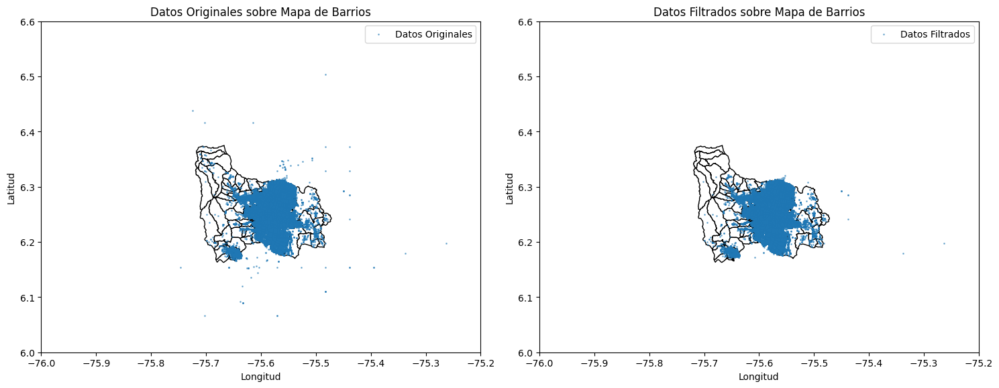

In [10]:
barrios = gpd.read_file("/content/drive/MyDrive/hurtos/BarrioVereda_2014.shp")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

barrios.plot(ax=ax1, edgecolor='black', color='white')
ax1.scatter(hurto_a_persona['longitud'], hurto_a_persona['latitud'], s=1, alpha=0.5, label='Datos Originales')
ax1.set_title('Datos Originales sobre Mapa de Barrios')
ax1.set_xlabel('Longitud')
ax1.set_ylabel('Latitud')
ax1.set_xlim(-76, -75.2)
ax1.set_ylim(6, 6.6)
ax1.legend()

barrios.plot(ax=ax2, edgecolor='black', color='white')
ax2.scatter(hurto_a_persona_filtrado['longitud'], hurto_a_persona_filtrado['latitud'], s=1, alpha=0.5, label='Datos Filtrados')
ax2.set_title('Datos Filtrados sobre Mapa de Barrios')
ax2.set_xlabel('Longitud')
ax2.set_ylabel('Latitud')
ax2.set_xlim(-76, -75.2)
ax2.set_ylim(6, 6.6)
ax2.legend()

plt.tight_layout()
plt.show()
hurto_a_persona = hurto_a_persona_filtrado

# Agrupación de Categorías de Lugares

Para simplificar las categorías de los lugares donde ocurren los hurtos, se utiliza un diccionario de mapeo que reduce la dimensionalidad de las variables originales agrupándolas en categorías más generales.

Qué se hace: Se crea un nuevo campo lugar_agrupado en el dataframe hurto_a_persona, que agrupa las categorías específicas de lugares en categorías más generales utilizando un diccionario de mapeo.



In [11]:
mapeo_categorias = {
    'Vía pública': 'Transporte',
    'Terminal de transporte': 'Transporte',
    'Estación del Metro': 'Transporte',
    'Estación del Metro plus': 'Transporte',
    'Paradero de bus': 'Transporte',
    'Aeropuerto': 'Transporte',
    'Puente peatonal': 'Transporte',
    'Metro Plus': 'Transporte',
    'Peaje': 'Transporte',
    'Institución de educación superior': 'Educación',
    'Institución educativa (jardín, primaria o secundaria)': 'Educación',
    'Residencia': 'Residencial',
    'Casa o apartamento': 'Residencial',
    'Conjunto residencial': 'Residencial',
    'Caseta vigilancia conjunto residencial': 'Residencial',
    'Centro comercial': 'Comercial',
    'Local comercial': 'Comercial',
    'Supermercado': 'Comercial',
    'Almacén tienda y otro': 'Comercial',
    'Plaza de mercado': 'Comercial',
    'Joyería': 'Comercial',
    'Compraventa': 'Comercial',
    'Bar o cantina': 'Entretenimiento',
    'Casino': 'Entretenimiento',
    'Teatro': 'Entretenimiento',
    'Parque': 'Entretenimiento',
    'Escenario deportivo': 'Entretenimiento',
    'Gimnasio': 'Entretenimiento',
    'Estadero': 'Entretenimiento',
    'Hospital o centro de salud': 'Salud',
    'Oficina': 'Servicios',
    'Hotel, motel y hostal': 'Servicios',
    'Restaurante': 'Servicios',
    'Taller mecánico': 'Servicios',
    'Droguería o farmacia': 'Servicios',
    'Biblioteca': 'Servicios',
    'Cementerio': 'Servicios',
    'Instalación judicial': 'Servicios',
    'Panadería': 'Servicios',
    'Instalación fuerza pública': 'Servicios',
    'Sede social, club, auditorio o similar': 'Servicios',
    'Funeraria y sala de velación': 'Servicios',
    'Baño': 'Servicios',
    'Sede política': 'Servicios',
    'Cafetería': 'Servicios',
    'Café internet': 'Servicios',
    'Consultorio jurídico': 'Servicios',
    'Lavadero de carros': 'Servicios',
    'Obra en construcción': 'Otros',
    'Quebrada o rio': 'Otros',
    'Reserva natural': 'Otros',
    'Lote baldío': 'Otros',
    'Potrero': 'Otros',
    'Matadero, carnicería y similar': 'Otros',
    'Hipodromo': 'Otros',
    'Cantera': 'Otros',
    'Finca': 'Otros',
    'Feria de ganado': 'Otros',
    'Desguazadero': 'Otros',
    'Sin dato': 'Otros'
}

hurto_a_persona['lugar_agrupado'] = hurto_a_persona['lugar'].map(mapeo_categorias)

# Limpieza de Datos Geográficos

Para asegurar que los datos utilizados en el análisis contengan valores válidos de coordenadas geográficas, se eliminan las filas con valores nulos o ceros en las columnas de latitud y longitud.

Qué se hace: Se eliminan las filas con valores nulos en las columnas latitud y longitud, y luego se eliminan las filas donde estas columnas tengan el valor 0.

In [12]:
datos_limpios = hurto_a_persona.dropna(subset=['latitud', 'longitud'])
datos_limpios = datos_limpios[(datos_limpios['latitud'] != 0) & (datos_limpios['longitud'] != 0)]

# Creacion de un primer mapa de calor
Para visualizar la distribución geográfica de los hurtos en Medellín, se utiliza un mapa de calor. Este tipo de visualización ayuda a identificar las áreas con mayor incidencia de hurtos cometidos con armas cortopunzantes. A continuación, se describen los pasos realizados para crear este mapa de calor.

**Qué se hace:** folium es una biblioteca de Python que permite la creación de mapas interactivos, y HeatMap es una extensión de folium utilizada específicamente para generar mapas de calor.

Este primer mapa es un acercamiento a ver la densidad de hurtos en Medellin, sin embargo hay varias cosas adicionales que cada observacion tiene por mostrar.

In [13]:
mapa_calor_limpios = folium.Map(location=[6.2442, -75.5918], zoom_start=12)

heat_data = [[row['latitud'], row['longitud']] for index, row in datos_limpios.iterrows()]

HeatMap(heat_data, blur=5, max_zoom=5, radius=6).add_to(mapa_calor_limpios)

mapa_calor_limpios

# ¿Cómo puedo obtener el mapa de Medellín, Colombia?

Usando la función geocode_to_gdf de osmnx, se puede obtener un GeoDataFrame que representa la ciudad de Medellín. a este mapa se le pueden añadir a gusto gran cantidad de atributos, queda a consideracion el uso de ellos para diferentes intenciones

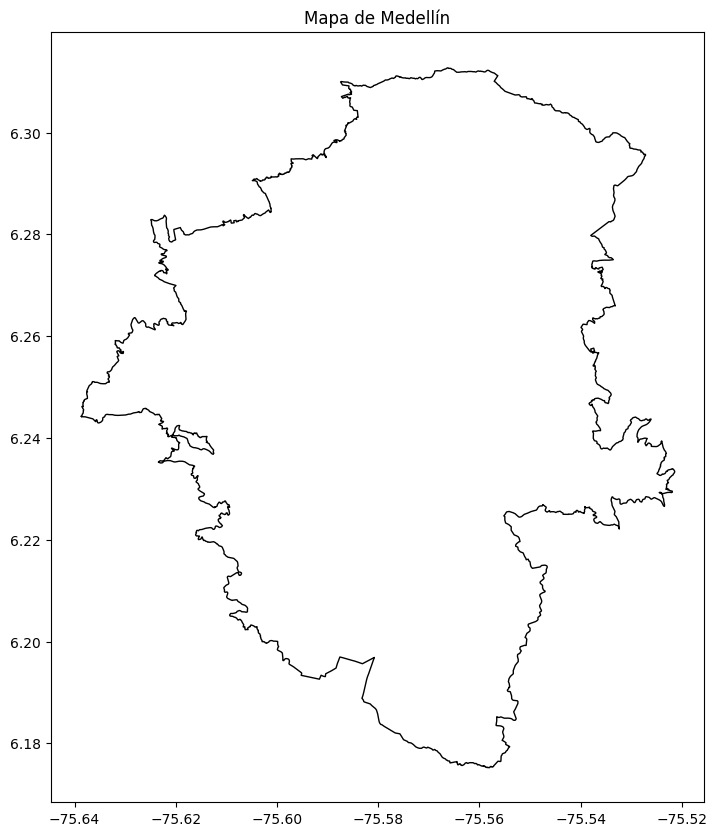

In [14]:
medellin = ox.geocode_to_gdf('Medellín, Colombia')

fig, ax = plt.subplots(figsize=(10, 10))
medellin.plot(ax=ax, color='white', edgecolor='black')
plt.title('Mapa de Medellín')
plt.show()

# Explorando funciones de **osmnx**

En esta sección, se explora el uso y las capacidades de OSMnx, una biblioteca de Python especializada en la recuperación, la construcción y el análisis de redes espaciales complejas a partir de OpenStreetMap.


# Grafo de calles

Para obtener un grafo de calles de Medellín, Colombia, utilizando OSMnx, se utiliza la función graph_from_place. Esta función permite recuperar datos de OpenStreetMap para construir redes viales específicas según el tipo de red especificado, en este caso, "drive" para redes vehiculares.

In [15]:
G = ox.graph_from_place("Medellin, Colombia", network_type="drive")

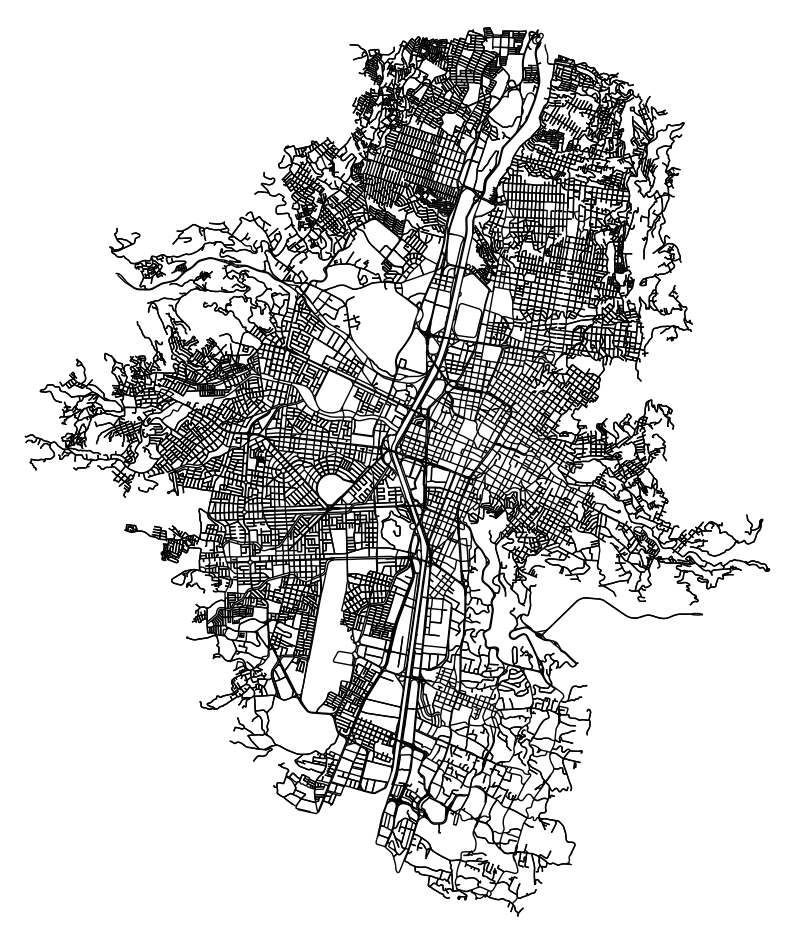

(<Figure size 1200x1200 with 1 Axes>, <Axes: >)

In [16]:
fig, ax = plt.subplots(figsize=(12, 12))

ox.plot_graph(G, ax=ax, node_color='none', edge_color='k')



#Extracción de Amenidades (Restaurantes) con OSMnx

Para obtener datos específicos sobre amenidades en Medellín, Colombia, utilizando OSMnx, se utiliza la función geometries_from_place. Esta función permite recuperar geometrías de OpenStreetMap basadas en etiquetas específicas, como "amenity" para identificar restaurantes.





In [17]:
amenities = ox.geometries_from_place("Medellin", tags={"amenity":"restaurant"})

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-18-f3c8bba73b99>:5: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  amenidades = ox.geometries_from_place("Medellin", tags={"amenity": "restaurant"})


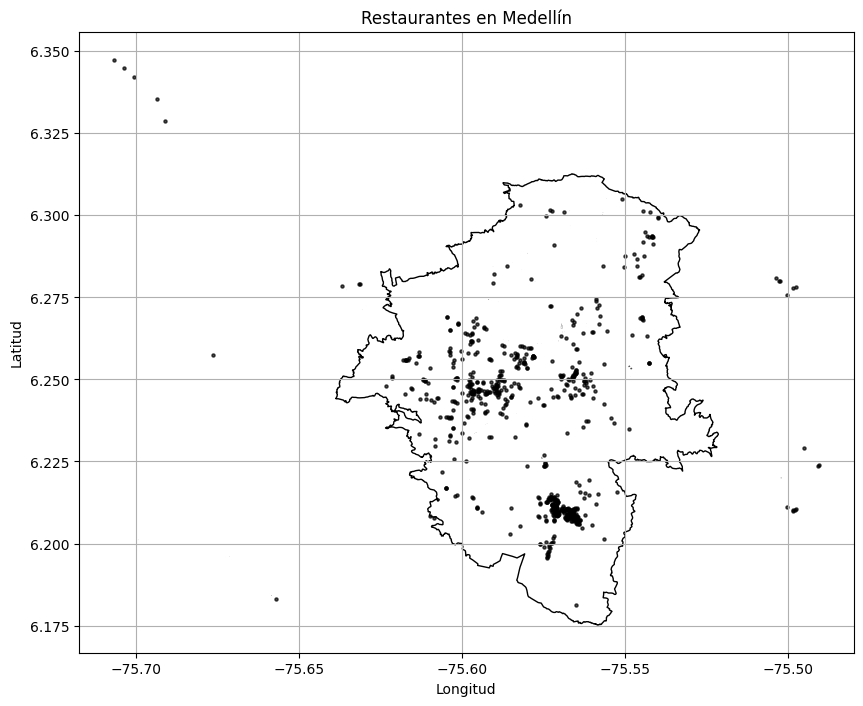

In [18]:
lugar = "Medellin, Colombia"
medellin = ox.geocode_to_gdf(lugar)

amenidades = ox.geometries_from_place("Medellin", tags={"amenity": "restaurant"})

fig, ax = plt.subplots(figsize=(10, 10))
medellin.plot(ax=ax, color='white', edgecolor='black')

amenidades.plot(ax=ax, markersize=5, color='black', alpha=0.7)

plt.title('Restaurantes en Medellín')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.grid(True)
plt.show()

# Universidades

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-19-5cd2ee14150c>:1: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  universidades = ox.geometries_from_place("Medellin", tags={"amenity": "university"})


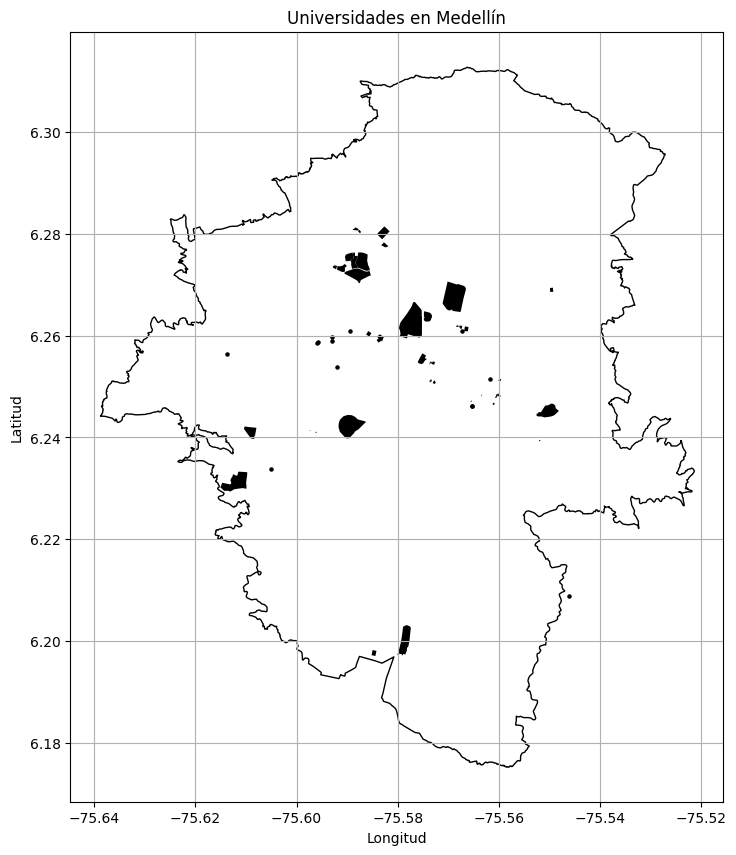

In [19]:
universidades = ox.geometries_from_place("Medellin", tags={"amenity": "university"})

fig, ax = plt.subplots(figsize=(10, 10))
medellin.plot(ax=ax, color='white', edgecolor='black')

universidades.plot(ax=ax, markersize=5, color="black")

plt.title('Universidades en Medellín')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.grid(True)
plt.show()

#Cajeros

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-20-eaeb71151ca2>:5: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  amenidades = ox.geometries_from_place("Medellin", tags={"amenity": "atm"})


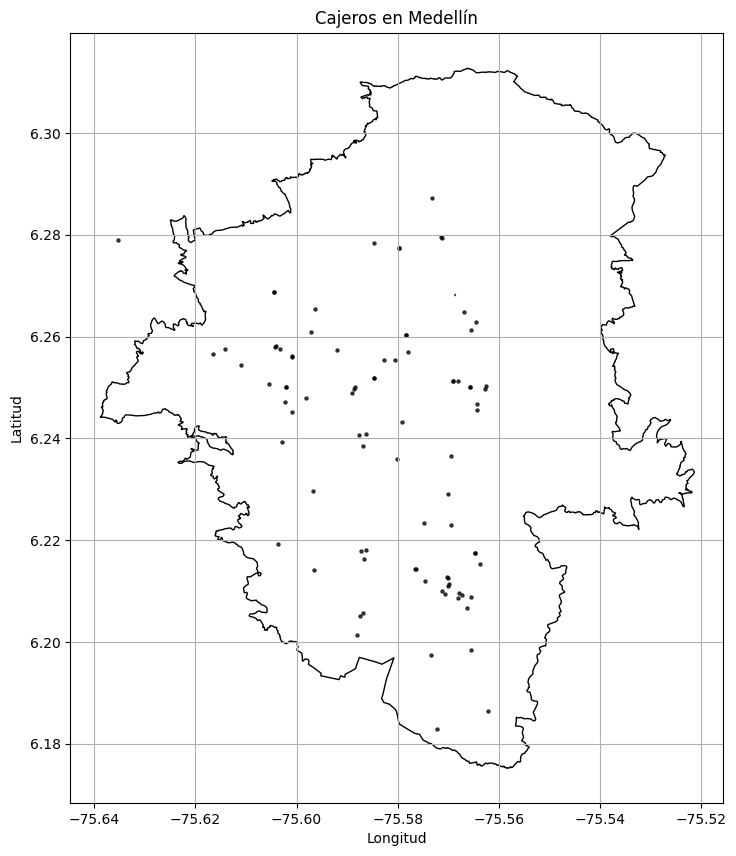

In [20]:
lugar = "Medellin, Colombia"
medellin = ox.geocode_to_gdf(lugar)

amenidades = ox.geometries_from_place("Medellin", tags={"amenity": "atm"})

fig, ax = plt.subplots(figsize=(10, 10))
medellin.plot(ax=ax, color='white', edgecolor='black')

amenidades.plot(ax=ax, markersize=5, color='black', alpha=0.7)

plt.title('Cajeros en Medellín')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.grid(True)
plt.show()

#Bancos

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-21-482295d97c1d>:5: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  amenidades = ox.geometries_from_place("Medellin", tags={"amenity": "bank"})


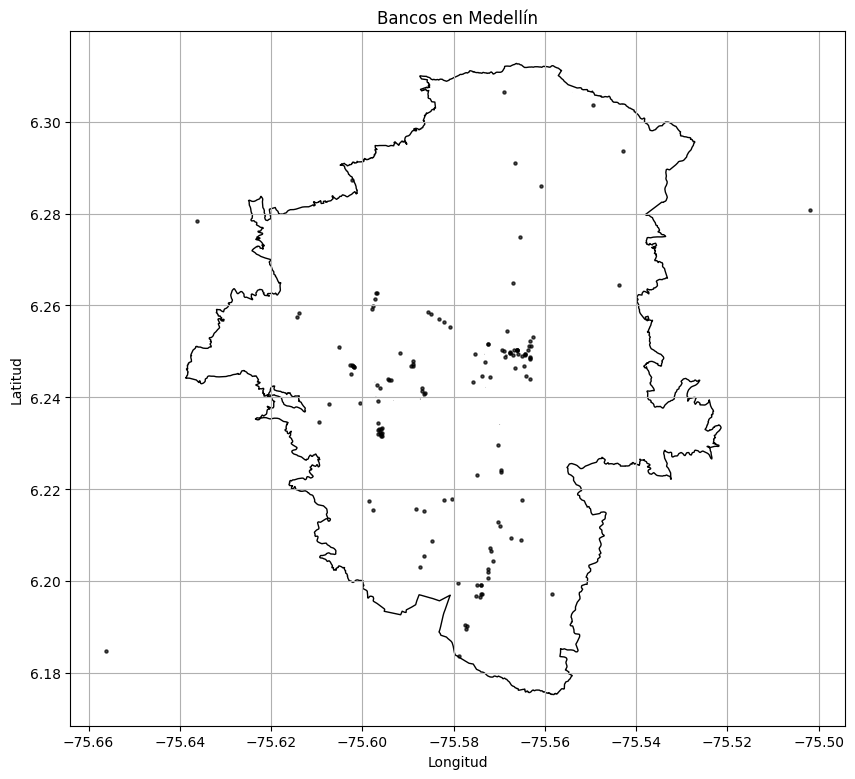

In [21]:
lugar = "Medellin, Colombia"
medellin = ox.geocode_to_gdf(lugar)

amenidades = ox.geometries_from_place("Medellin", tags={"amenity": "bank"})

fig, ax = plt.subplots(figsize=(10, 10))
medellin.plot(ax=ax, color='white', edgecolor='black')

amenidades.plot(ax=ax, markersize=5, color='black', alpha=0.7)

plt.title('Bancos en Medellín')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.grid(True)
plt.show()

# Que otra alternativa existe para obtener un mapa de Medellin?

Generalmente, las ciudades cuentan con archivos de tipo shapefile (shp) que contienen polígonos que delimitan tanto el perímetro de la ciudad como sus barrios. Estos archivos son útiles para representar de manera precisa los límites geográficos y administrativos. En este proyecto, utilizaremos un archivo shapefile para obtener los límites de los barrios de Medellín. Este archivo está incluido en los archivos del repositorio y se denomina BarrioVereda_2014.shp.

Al cargar este archivo con la funcion gpd.read() se nos cargara un geopandas que contendra una columna llamada "geometry" que contendra el poligono de cada barrio

In [22]:
barrios = gpd.read_file("/content/drive/MyDrive/hurtos/BarrioVereda_2014.shp")
barrios.head(5)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bo

,CODIGO,NOMBRE,ABREVIATUR,IDENTIFICA,LIMITECOMU,ZHFISICAGE,LIMITEMUNI,VIGENCIA_F,SUBTIPO_BA,LINK_DOCUM,geometry
0,Inst_15,U.P.B,None,Inst_15,11,None,001,None,1,None,"POLYGON ((-75.58911 6.24447, -75.58900 6.24443..."
1,Inst_18,Cerro Nutibara,None,Inst_18,16,None,001,None,1,None,"POLYGON ((-75.57669 6.23733, -75.57628 6.23612..."
2,0610,Mirador del Doce,None,0610,06,None,001,None,1,None,"POLYGON ((-75.58450 6.30520, -75.58445 6.30519..."
3,1620,El Nogal-Los Almendros,None,1620,16,None,001,None,1,None,"POLYGON ((-75.59551 6.23662, -75.59552 6.23660..."
4,0612,El Triunfo,None,0612,06,None,001,None,1,None,"POLYGON ((-75.58618 6.31007, -75.58616 6.31007..."


# Visualizar el mapa de medellin

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


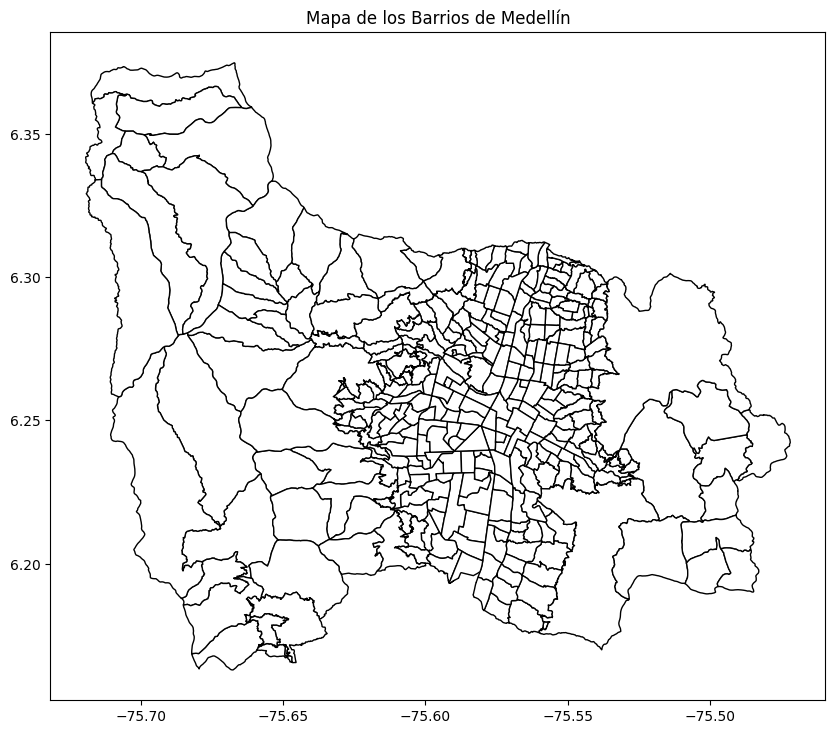

In [23]:
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(ax=ax, edgecolor='black', color='white')
plt.title('Mapa de los Barrios de Medellín')
plt.show()

# Convertir los Datos de Hurtos a un GeoDataFrame
Esto convertira nuestro df original en un GeoDataFrame, si nos fijamos en la columna geometry habra un POINT, a diferencia de nuestro archivo "barrios" que contiene un poligono


In [24]:
gdf_hurtos = gpd.GeoDataFrame(datos_limpios, geometry=gpd.points_from_xy(datos_limpios.longitud, datos_limpios.latitud), crs='EPSG:4326')
gdf_hurtos.head(5)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,fecha_hecho,cantidad,latitud,longitud,sexo,edad,estado_civil,grupo_actor,actividad_delictiva,parentesco,...,bien,categoria_bien,grupo_bien,modelo,color,permiso,unidad_medida,fecha_ingestion,lugar_agrupado,geometry
0,2017-01-01 01:00:00-05:00,1.0,6.299703,-75.582016,Mujer,33,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.58202 6.29970)
1,2017-01-01 15:00:00-05:00,1.0,6.250917,-75.566160,Mujer,26,Soltero(a),Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.56616 6.25092)
2,2017-01-01 14:00:00-05:00,1.0,6.274836,-75.554909,Hombre,30,Soltero(a),Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.55491 6.27484)
3,2017-01-01 16:00:00-05:00,1.0,6.276236,-75.553533,Hombre,37,Casado(a),Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.55353 6.27624)
4,2017-01-01 16:00:00-05:00,1.0,6.250339,-75.586914,Hombre,87,Casado(a),Sin dato,Sin dato,Sin dato,...,Billetera,Prendas de vestir y accesorios,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.58691 6.25034)


# ¿Cómo puedo unir datos de hurtos con información de barrios en Medellín utilizando geopandas?

Para unir los datos de hurtos con la información de los barrios en Medellín, necesitamos utilizar operaciones espaciales que nos permitan relacionar cada registro de hurtos con el barrio correspondiente.

Utilizando la función gpd.sjoin() de geopandas

In [25]:
hurto_barrios = gpd.sjoin(gdf_hurtos, barrios)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# ¿Cómo puedo contar el número de registros de hurtos por cada barrio en Medellín?

Para realizar esta tarea, necesitamos agrupar los datos por los polígonos de los barrios y contar cuántos registros de hurtos hay dentro de cada uno.

Utilizando el método groupby() de pandas y size()

Utilizamos el método groupby() en el GeoDataFrame hurto_barrios agrupando por la columna index_right, que contiene el índice de los polígonos de los barrios a los que pertenecen los registros de hurtos.

hurto_counts será una serie (o DataFrame si se utiliza reset_index()) que contendrá el número de registros de hurtos por cada índice de polígono de barrio. Cada índice corresponde a un barrio específico en Medellín.

Ademas agregaremos hurto_counts dentro de el df de barrios para tener la metrica de hurtos por barrio

In [26]:
hurto_counts = hurto_barrios.groupby('index_right').size()
barrios['hurto_count'] = barrios.index.map(hurto_counts).fillna(0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# ¿Cómo puedo generar un mapa de calor de hurtos por barrios en Medellín usando Matplotlib y Contextily?



Creación de la figura y los ejes sin la base de contextily

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


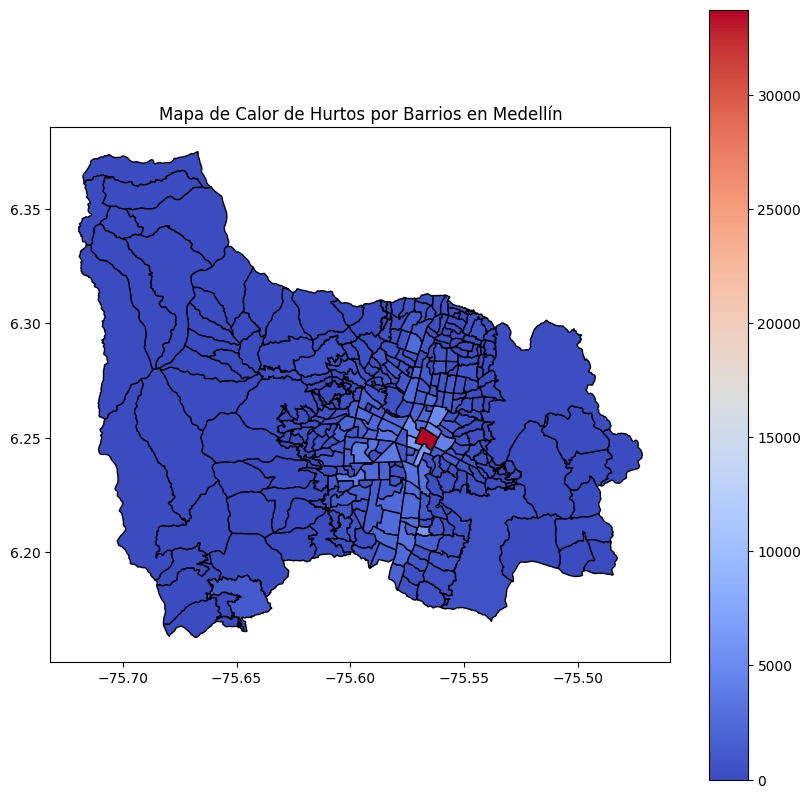

In [27]:
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(column='hurto_count', ax=ax, legend=True, cmap='coolwarm', edgecolor='black')
plt.title('Mapa de Calor de Hurtos por Barrios en Medellín')
plt.show()

Creación de la figura y los ejes con la base de contextily

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


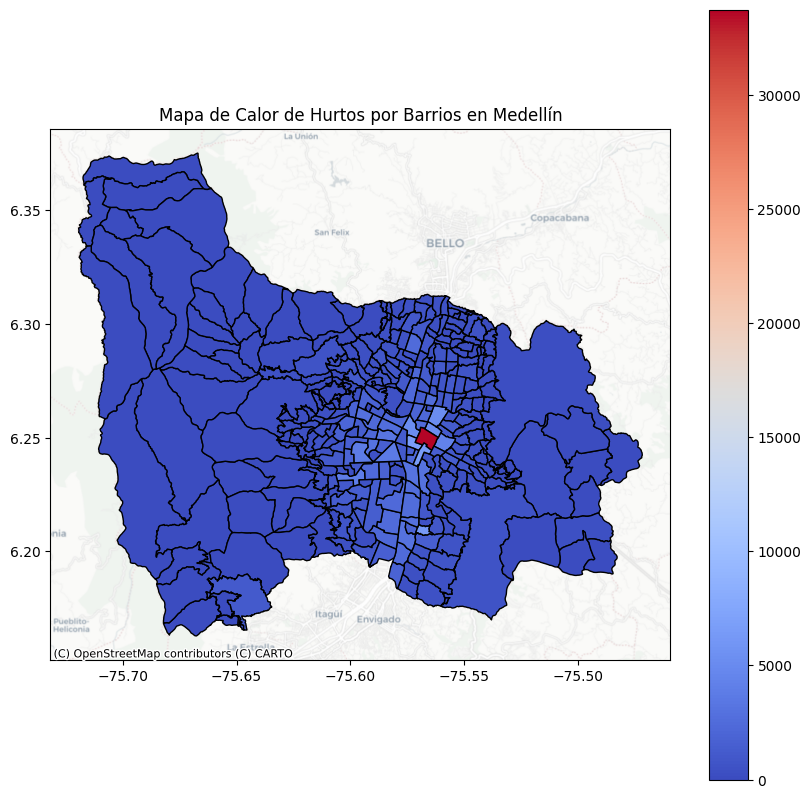

In [28]:
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(column='hurto_count', ax=ax, legend=True, cmap='coolwarm', edgecolor='black')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=barrios.crs.to_string())
plt.title('Mapa de Calor de Hurtos por Barrios en Medellín')
plt.show()

El mapa revela claramente un problema de visualización al mostrar una concentración significativa de hurtos en un barrio específico de Medellín (La Candelaria). Debido a la amplia escala de diferencias entre los datos, es necesario ajustar los intervalos para que las gráficas puedan ofrecer una representación más informativa y detallada.

# ¿Cómo se puede visualizar el mapa de calor de hurtos por barrios en Medellín utilizando esquemas de clasificación basados en quantiles?

Usamos ***classifier = mc.Quantiles(barrios['hurto_count']***, k=12) de la libreria mapclassify: Primero, el programa divide los barrios de Medellín en grupos basados en la cantidad de hurtos que tienen. Esto nos ayuda a ver claramente qué áreas tienen más problemas de seguridad y cuáles menos, podemos modficar el parametro **k** para añadir o quitar cuantiles

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


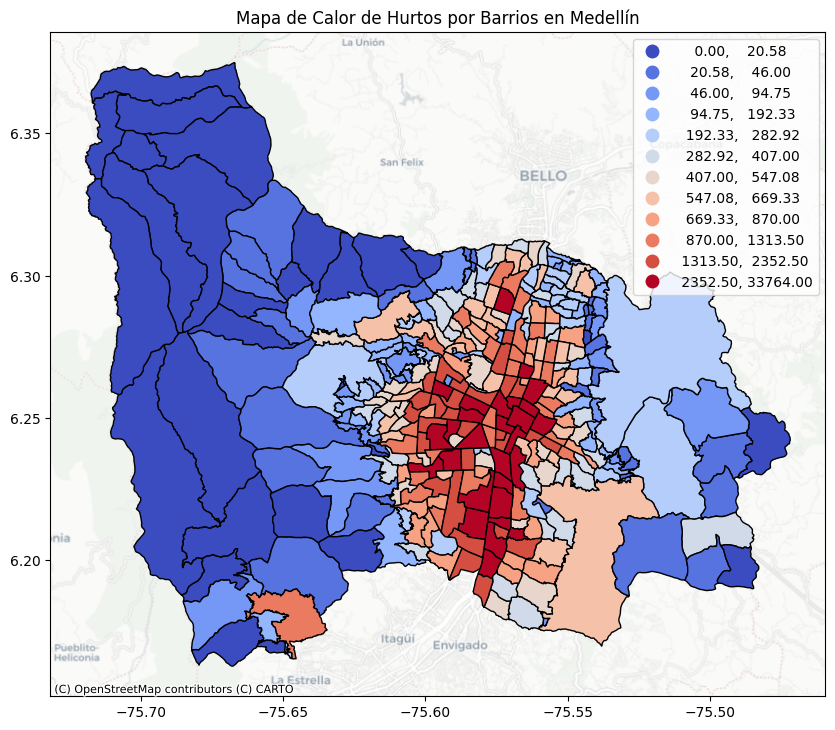

In [29]:
classifier = mc.Quantiles(barrios['hurto_count'], k=12)
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(column='hurto_count', ax=ax, legend=True, cmap='coolwarm', scheme='Quantiles', classification_kwds={'k': 12}, edgecolor='black')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=barrios.crs.to_string())

plt.title('Mapa de Calor de Hurtos por Barrios en Medellín')
plt.show()

# Índice de Moran y Contigüidad Reina: Análisis de Autocorrelación Espacial

**¿Qué es el Índice de Moran?**
El Índice de Moran es una medida estadística utilizada para evaluar la autocorrelación espacial de los datos. En términos sencillos, nos ayuda a determinar si los valores similares están agrupados espacialmente (autocorrelación positiva) o si están distribuidos de manera aleatoria (autocorrelación negativa o nula).

**Contigüidad Tipo Reina:**
En el contexto del análisis espacial, la contigüidad tipo reina se refiere a la definición de vecindad entre unidades geográficas, como los barrios en tu caso. Bajo la contigüidad tipo reina, dos unidades geográficas (en este caso, barrios) se consideran vecinas si comparten al menos un punto de su frontera.

Aquí, ***weights.Queen.from_dataframe(barrios)*** crea una matriz de pesos basada en la contigüidad tipo reina a partir de los datos geográficos de los barrios. Esta matriz define qué barrios son vecinos entre sí según la definición de contigüidad reina.

In [30]:
w = weights.Queen.from_dataframe(barrios)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-30-413fbc792650>:1: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = weights.Queen.from_dataframe(barrios)


Cálculo del Índice de Moran:
***moran = esda.Moran(barrios['hurto_count'], w)***

Con la matriz de pesos definida, esda.Moran() calcula el Índice de Moran para la variable hurto_count (número de hurtos) en los barrios. Este índice cuantifica la autocorrelación espacial de los hurtos, ayudando a determinar si hay patrones espaciales significativos en la distribución de los hurtos entre los barrios.

In [31]:
moran = esda.Moran(barrios['hurto_count'], w)
print("Índice de Moran global:", moran.I)
print("Valor esperado bajo aleatoriedad espacial:", moran.EI)
print("P-valor:", moran.p_norm)
print("Valor Z:", moran.z_norm)

Índice de Moran global: 0.29706680071918207
Valor esperado bajo aleatoriedad espacial: -0.0030211480362537764
P-valor: 8.946999580481224e-21
Valor Z: 9.34782328931346


El Índice de Moran global es una medida que indica la autocorrelación espacial de los datos. En este caso, un valor de 0.297 indica que existe una autocorrelación positiva significativa entre los datos de hurto por barrio en Medellín. Esto significa que los barrios con altos índices de hurto tienden a estar cerca de otros barrios con altos índices, y lo mismo ocurre para los barrios con bajos índices de hurto. Es decir, la distribución de los hurtos no es aleatoria, sino que hay una tendencia a la agrupación espacial.

In [32]:
gdf_datos_limpios = gpd.GeoDataFrame(
    datos_limpios, geometry=gpd.points_from_xy(datos_limpios.longitud, datos_limpios.latitud))
datos_con_barrios = gpd.sjoin(gdf_datos_limpios, barrios, how="left", op='within')

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
<ipython-input-32-61a502c0fbd4>:3: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  datos_con_barrios = gpd.sjoin(gdf_datos_limpios, barrios, how="left", op='within')


# Vamos a determinar con que armas se esta robando en medellin

Este código agrupa los datos del DataFrame hurto_barrios según dos criterios: el nombre del barrio (NOMBRE) y el tipo de arma usado en el hurto (arma_medio). Esto significa que estamos contando cuántas veces ocurre cada combinación de barrio y tipo de arma en los datos de hurto.

Este proceso nos permite obtener una visión clara y cuantitativa de la distribución de los tipos de hurto en los diferentes barrios de Medellín, facilitando análisis posteriores sobre patrones de criminalidad y seguridad urbana.


In [33]:
frecuencias = hurto_barrios.groupby(['NOMBRE', 'arma_medio']).size().reset_index(name='frecuencia')
frecuencias.head(10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,NOMBRE,arma_medio,frecuencia
0,Aguas Frias,Arma cortopunzante,3
1,Aguas Frias,Arma de fuego,7
2,Aguas Frias,No,20
3,Aldea Pablo VI,Arma cortopunzante,5
4,Aldea Pablo VI,Arma de fuego,8
5,Aldea Pablo VI,No,18
6,Alejandro Echavarría,Arma cortopunzante,142
7,Alejandro Echavarría,Arma de fuego,235
8,Alejandro Echavarría,Escopolamina,4
9,Alejandro Echavarría,No,365


Visualizando los tipos de armas que se usan en medellin para los hurtos usando un simple grafico de barras, En el dataframe original, el tipo de arma **"No"** se refiere a un hurto sin uso de arma, por lo que de aqui en adelante es importante tener esta informacion clara.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


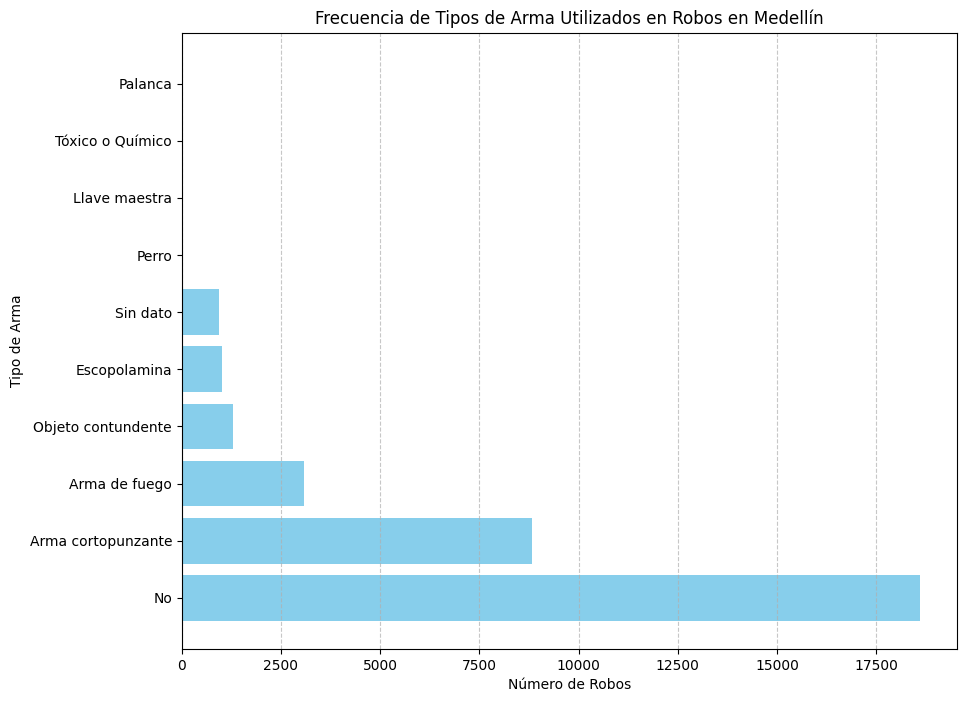

In [34]:
frecuencias = frecuencias.sort_values(by='frecuencia', ascending=False)
plt.figure(figsize=(10, 8))
bars = plt.barh(frecuencias['arma_medio'], frecuencias['frecuencia'], color='skyblue')

plt.xlabel('Número de Robos')
plt.ylabel('Tipo de Arma')
plt.title('Frecuencia de Tipos de Arma Utilizados en Robos en Medellín')
plt.grid(axis='x', linestyle='--', alpha=0.7)


# ¿Cómo se calcula la probabilidad de ocurrencia de robos con diferentes tipos de armas en cada barrio de Medellín?



*   Primero, agrupamos los datos de los robos por el tipo de arma utilizada y por cada barrio de Medellín. Esto nos permite contar cuántas veces se ha reportado un robo con un tipo específico de arma en cada barrio, lo cual hicimos anteriormente y esta en la variable **frecuencias**
*   Luego, calculamos el total de robos ocurridos en cada barrio sumando las frecuencias de todos los tipos de armas.

*   Para obtener la probabilidad de que un robo en un barrio específico sea cometido con cierto tipo de arma, dividimos la frecuencia de ese tipo de arma en ese barrio entre el total de robos en ese mismo barrio.






In [35]:
total_por_barrio = frecuencias.groupby('NOMBRE')['frecuencia'].sum()
frecuencias['probabilidad'] = frecuencias.apply(lambda row: row['frecuencia'] / total_por_barrio[row['NOMBRE']], axis=1)
frecuencias.head(10)

,NOMBRE,arma_medio,frecuencia,probabilidad
768,La Candelaria,No,18599,0.550853
765,La Candelaria,Arma cortopunzante,8824,0.261343
691,Guayaquil,No,4124,0.624470
515,El Poblado,No,3822,0.596721
766,La Candelaria,Arma de fuego,3082,0.091281
120,Barrio Colón,No,2709,0.419090
1378,San Benito,No,2325,0.451544
117,Barrio Colón,Arma cortopunzante,2304,0.356436
1693,Villa Nueva,No,1958,0.372456
1340,Prado,No,1885,0.360008


## ¿Cómo se visualizan las probabilidades de robos con diferentes armas en cada barrio de Medellín utilizando Python?



# Crear el mapa interactivo:
Aquí, se crea un objeto Map de Folium centrado en Medellín (location=[6.2442, -75.5918]) con un nivel de zoom inicial de 12 y utilizando el conjunto de teselas (tiles) de mapa de CartoDB Positron.


In [36]:
m = folium.Map(location=[6.2442, -75.5918], zoom_start=12, tiles='CartoDB dark_matter')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#Agregar datos de probabilidades de armas por barrio:




In [37]:
for idx, row in frecuencias.iterrows():
    barrio_polygon = barrios[barrios['NOMBRE'] == row['NOMBRE']]['geometry'].values[0]
    barrio_centroid = barrio_polygon.centroid

    folium.CircleMarker(
        location=[barrio_centroid.y, barrio_centroid.x],
        radius=row['probabilidad']*25,
        popup=f"Barrio: {row['NOMBRE']}<br>Arma: {row['arma_medio']}<br>Probabilidad: {row['probabilidad']:.2f}",
        color='crimson',
        fill=True,
        fill_color='crimson',
        fill_opacity=0.7,
        line_opacity=0.2
    ).add_to(m)

#Mostrar el mapa interactivo:
En este mapa interactivo, cada círculo representa un barrio de Medellín. Al hacer clic en cualquier barrio, se despliega información sobre el arma con mayor probabilidad de ser utilizada en robos dentro de ese barrio, junto con la probabilidad asociada. Es importante aclarar que esta probabilidad indica la frecuencia relativa de robos cometidos con esa arma en comparación con otros tipos de armas en el mismo barrio no la probabilidad de ser robado dentro del barrio.


In [38]:
m

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Unión de datos con el GeoDataFrame de barrios
 Finalmente, combinamos estos datos de frecuencias y probabilidades calculadas con el GeoDataFrame de barrios, utilizando la función merge de pandas. Esto nos permite agregar la información de las frecuencias y probabilidades al conjunto de datos geoespaciales de los barrios.

In [39]:
barrios_probabilidades = pd.merge(barrios, frecuencias, on='NOMBRE', how='left')

#¿Cómo se visualiza la probabilidad de ser robado con diferentes tipos de armas en los barrios de Medellín?

Primero, necesitamos conocer qué tipos de armas se están considerando en nuestros datos. Esto se logra utilizando el método unique() en la columna 'arma_medio' del DataFrame barrios_probabilidades.

Esto nos da una lista de todas las categorías únicas de armas que están siendo investigadas en el análisis.



In [40]:
categorias_armas = barrios_probabilidades['arma_medio'].unique()
print(categorias_armas)

['No' 'Arma de fuego' 'Arma cortopunzante' 'Objeto contundente'
 'Escopolamina' 'Sin dato' 'Llave maestra' 'Palanca' nan
 'Tóxico o Químico' 'Perro']


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


**para este analisis solo se tomara la categorias de "No" que se refiere a hurto sin arma, "Arma cortopunzante", "Arma de fuego" y Objeto contundente**

In [41]:
categorias_seleccionadas = ["No", "Arma cortopunzante", "Arma de fuego", "Objeto contundente"]
barrios_seleccionados = barrios_probabilidades[barrios_probabilidades['arma_medio'].isin(categorias_seleccionadas)]

# Creacion del plot

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


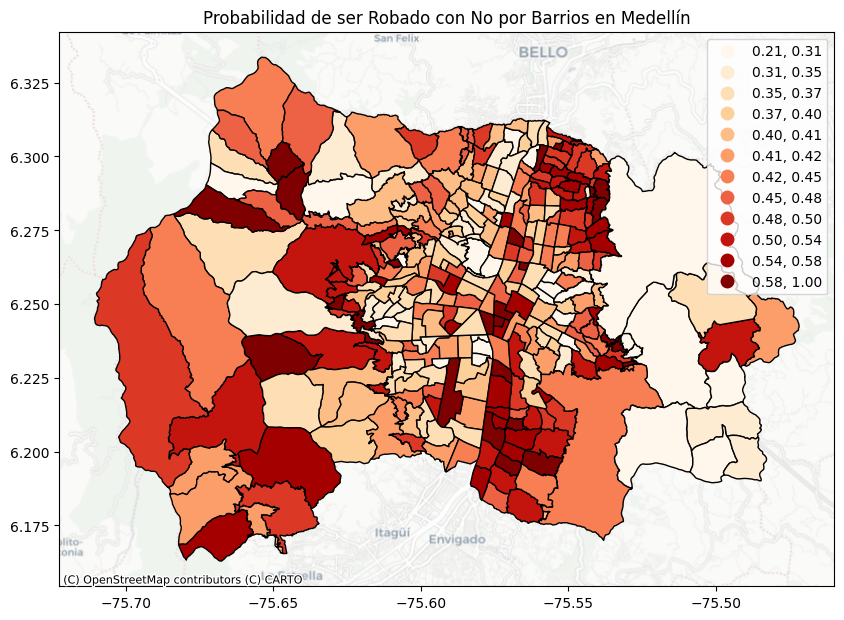

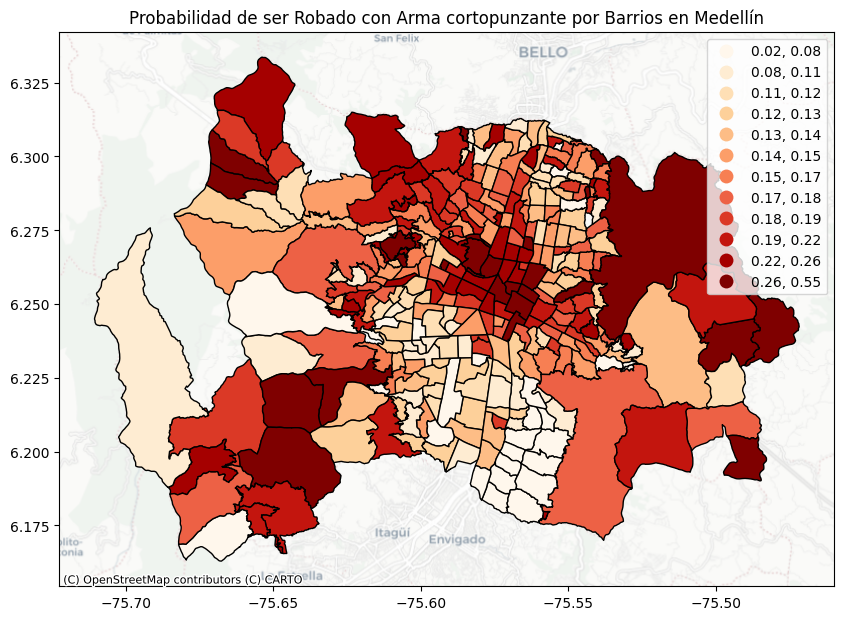

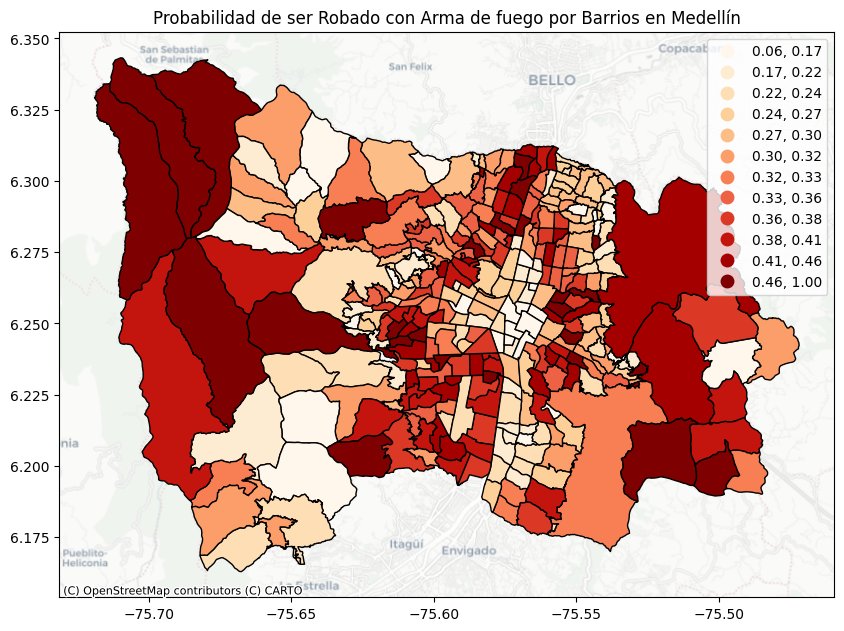

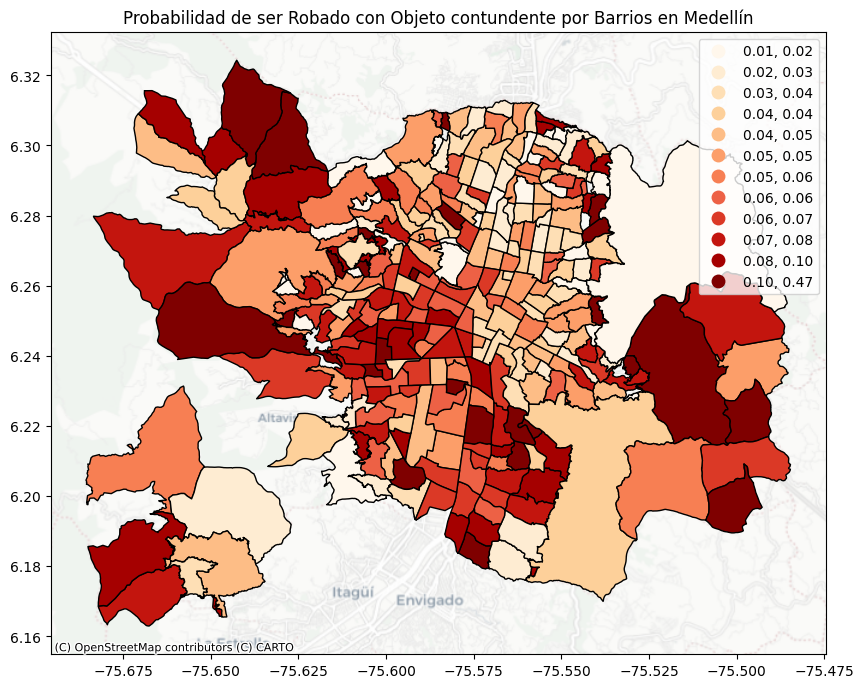

In [42]:
for categoria in categorias_seleccionadas:
    barrios_categoria = barrios_seleccionados[barrios_seleccionados['arma_medio'] == categoria]

    fig, ax = plt.subplots(figsize=(10, 10))
    barrios_categoria.plot(column='probabilidad', ax=ax, legend=True, cmap='OrRd', scheme='Quantiles', classification_kwds={'k': 12}, edgecolor='black')
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=barrios_categoria.crs.to_string())

    plt.title(f'Probabilidad de ser Robado con {categoria} por Barrios en Medellín')
    plt.show()

#¿Cómo se calcula la probabilidad de ser robado en cada barrio de Medellín?


Ordenamiento por frecuencia de hurtos:

In [43]:
barrios = barrios.sort_values(by='hurto_count', ascending=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Cálculo del total de hurtos:


In [44]:
total_hurtos = barrios['hurto_count'].sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Cálculo de la probabilidad de ser robado en cada barrio:


In [45]:
barrios['probabilidad'] = barrios['hurto_count'] / total_hurtos

Visualización del resultado:



In [46]:
print(barrios[['NOMBRE', 'probabilidad']].head(25))


                 NOMBRE  probabilidad
258       La Candelaria      0.118885
196           Guayaquil      0.023253
262        Barrio Colón      0.022760
183          El Poblado      0.022552
223         Villa Nueva      0.018510
47                Prado      0.018436
130          San Benito      0.018130
145              Boston      0.015098
102               Belén      0.013806
140            Laureles      0.013352
164  Los Conquistadores      0.012690
186            Naranjal      0.011278
153    Perpetuo Socorro      0.011024
98          Bolivariana      0.010901
43         Patio Bonito      0.010605
220           San Diego      0.010489
259              Manila      0.009961
300             Estadio      0.009922
15      Barrio Colombia      0.009236
241        Suramericana      0.009183
191             Sevilla      0.008905
226       Villa Carlota      0.008827
19           Campo Amor      0.008736
20        La Aguacatala      0.008493
298            Castilla      0.008454


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#¿Cómo se identifican y visualizan los barrios con mayor probabilidad de ser robados con diferentes tipos de armas en Medellín?




*   Definición de categorías seleccionadas
*   Iteración sobre cada categoría de arma
*   Selección y ordenamiento de los barrios
*   Creación del gráfico de barras horizontal

Se hizo una seleccion de los 20 barrios con mas probabilidad de ocurrencia dado un tipo de arma, sin embargo, se puede modificar variando el ***.head()*** con el criterio que se requiera, ademas se modifico para que no aparecieras los barrios con 100% de probabilidad de ocurrencia dado que estos barrios daban estos resultados por el poco numero de observaciones

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bo

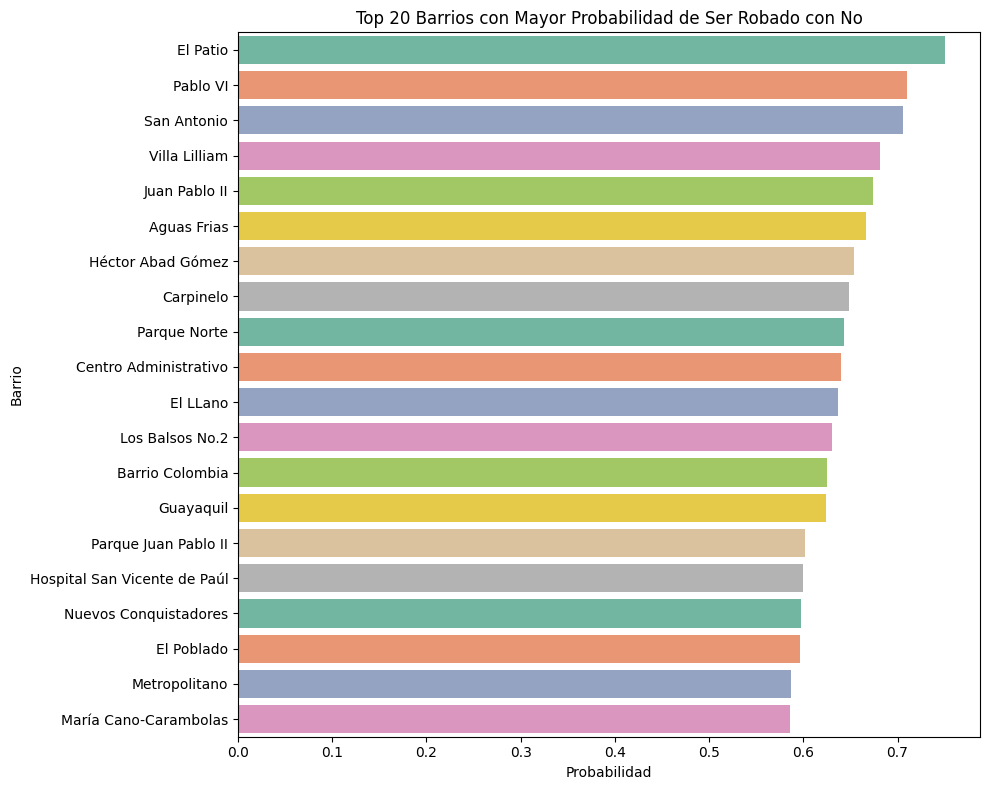

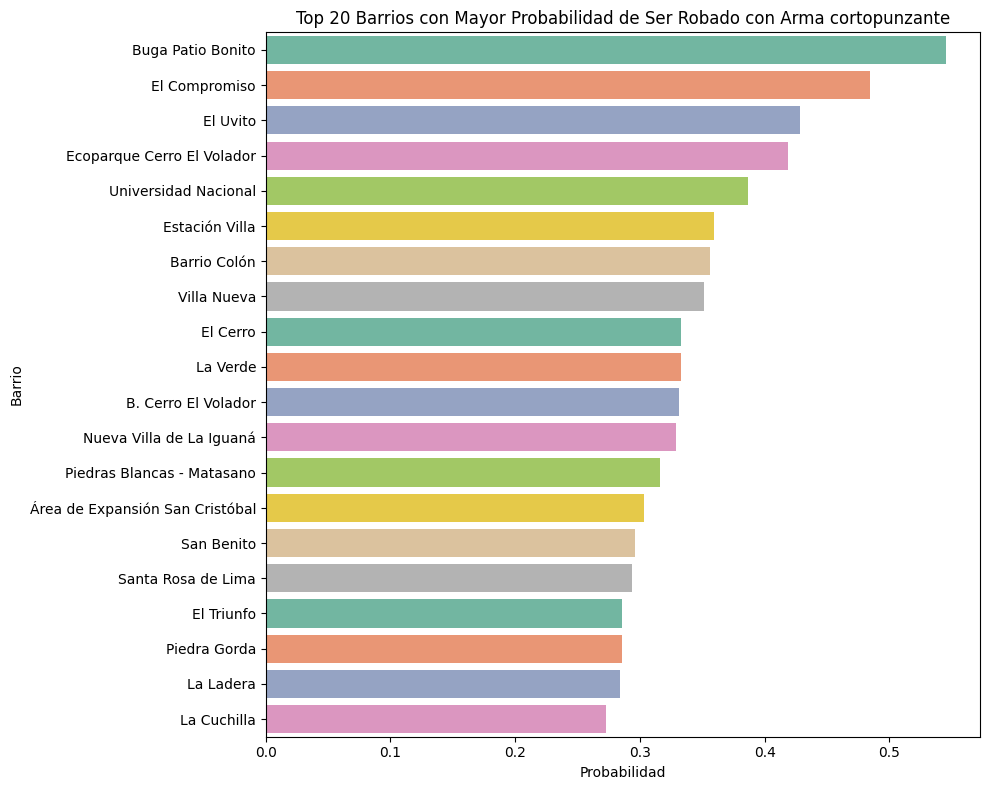

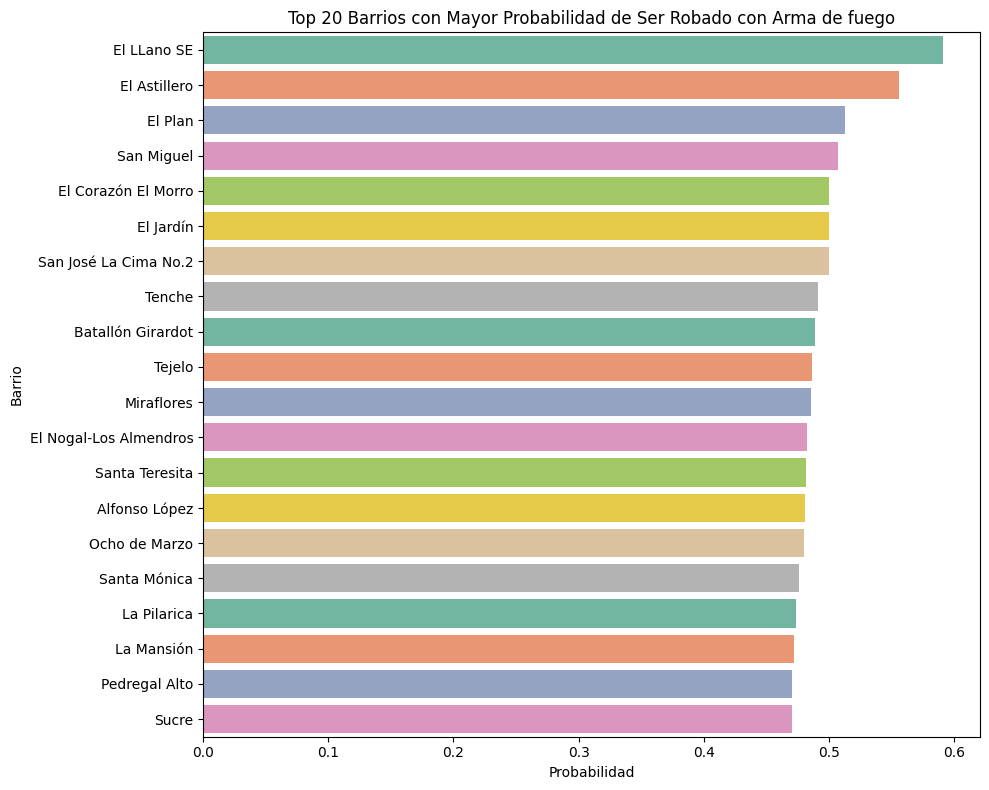

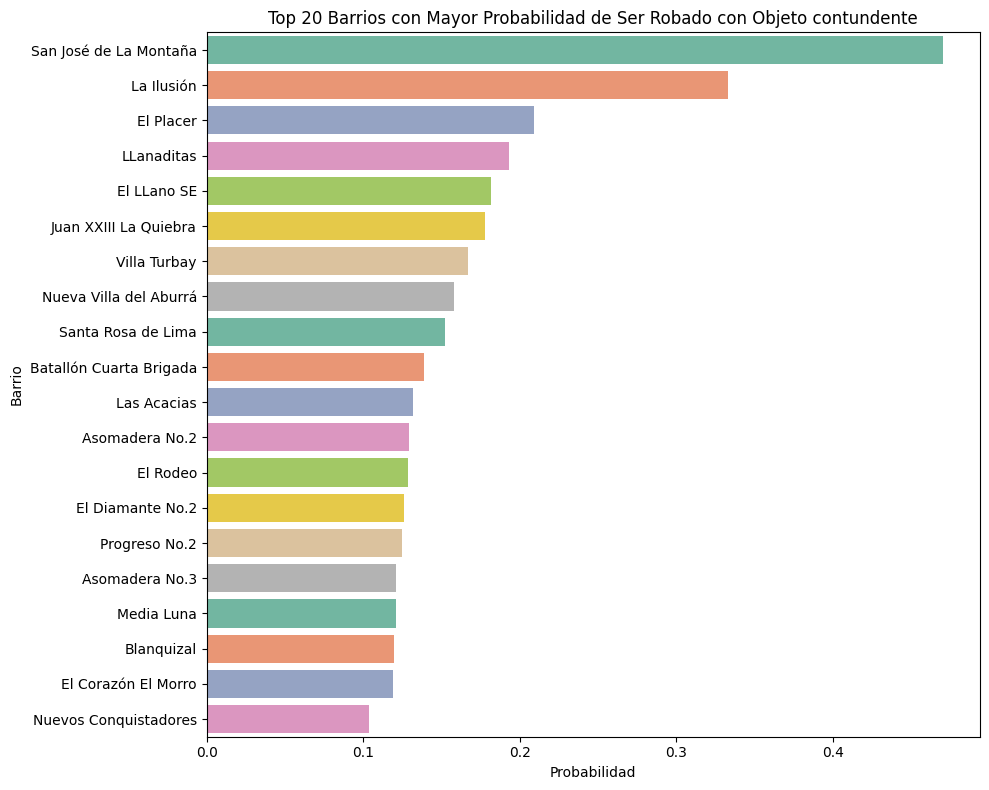

In [47]:
for categoria in categorias_seleccionadas:
    barrios_filtrados = barrios_probabilidades[(barrios_probabilidades['arma_medio'] == categoria) &
                                               (barrios_probabilidades['probabilidad'] != 1)]

    barrios_filtrados = barrios_filtrados.sort_values(by='probabilidad', ascending=False).head(20)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='probabilidad', y='NOMBRE', data=barrios_filtrados, palette='Set2', hue='NOMBRE', legend=False)
    plt.title(f'Top 20 Barrios con Mayor Probabilidad de Ser Robado con {categoria}')
    plt.xlabel('Probabilidad')
    plt.ylabel('Barrio')
    plt.tight_layout()
    plt.show()

#Otra estretegia de visualización

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


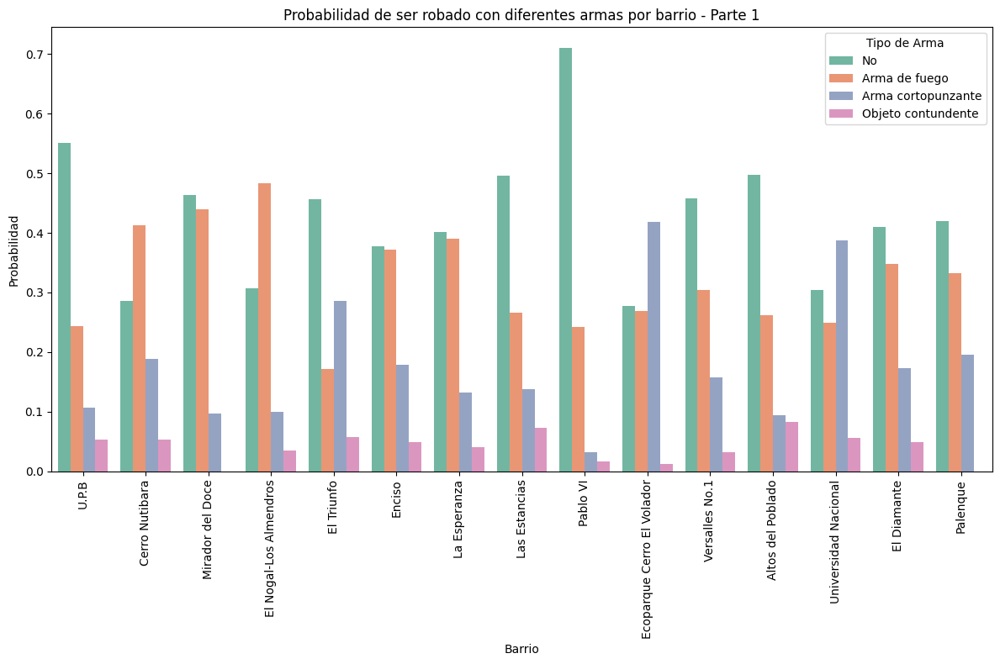

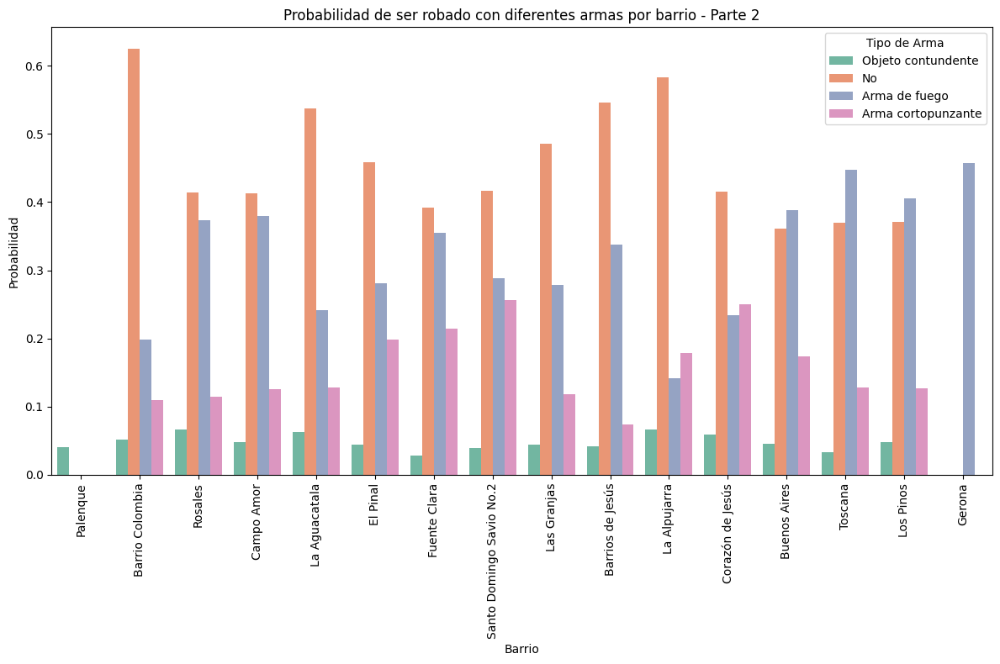

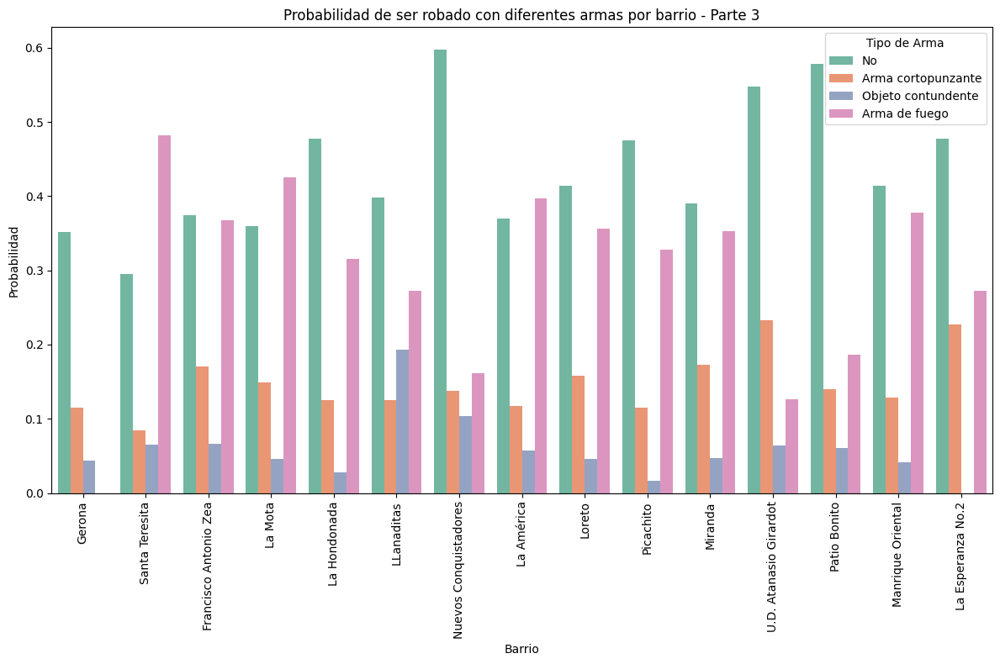

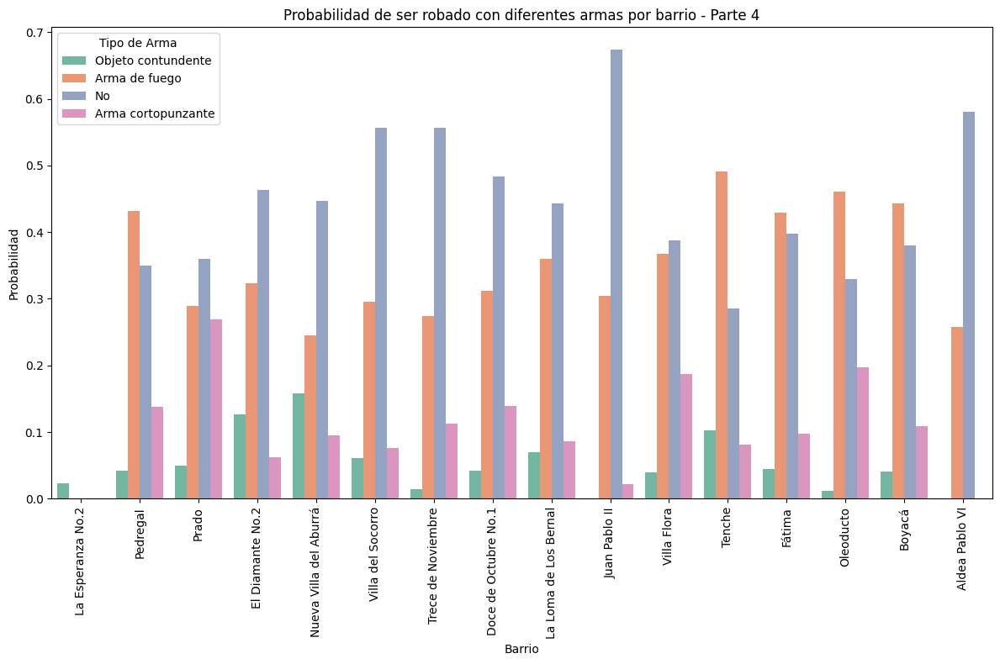

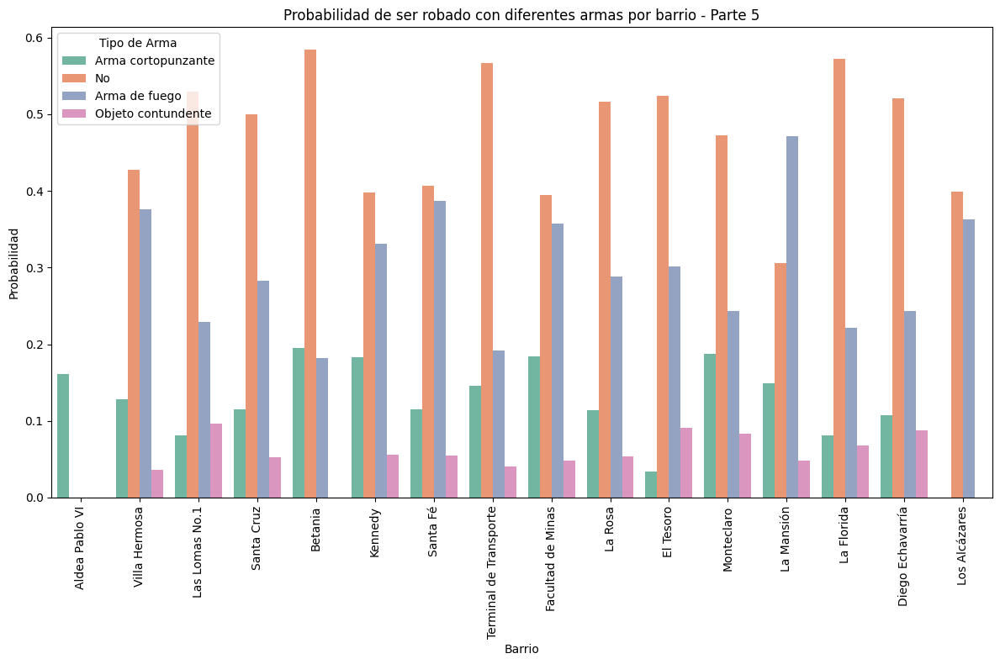

...

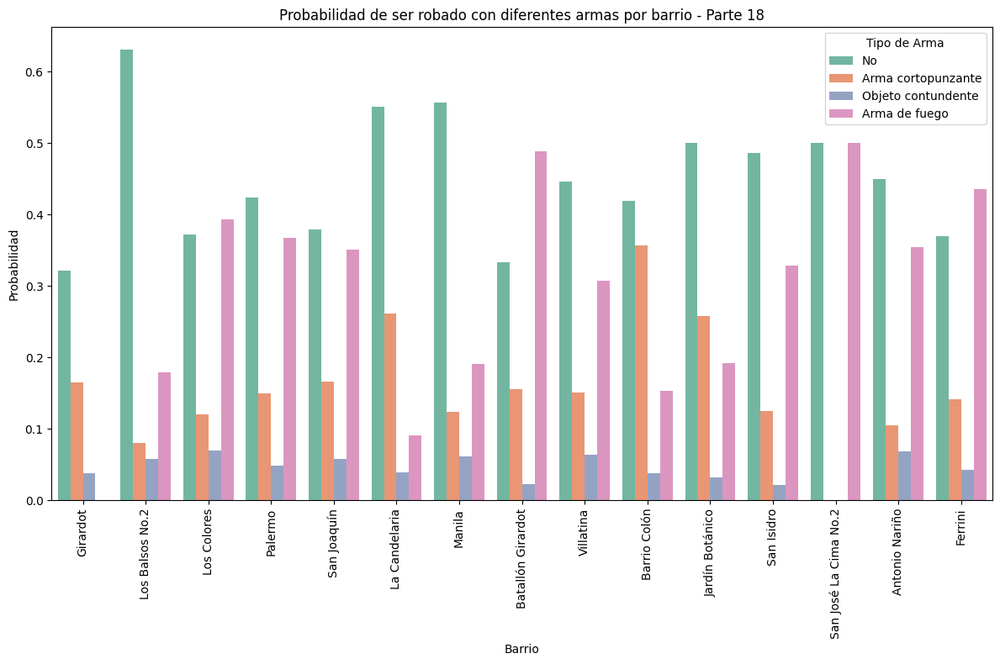

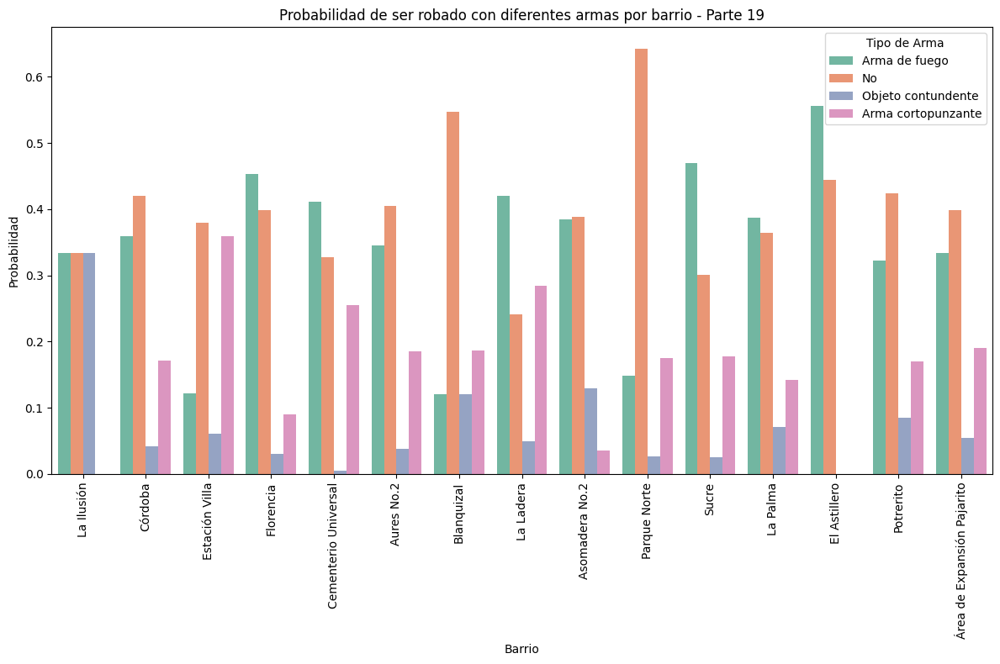

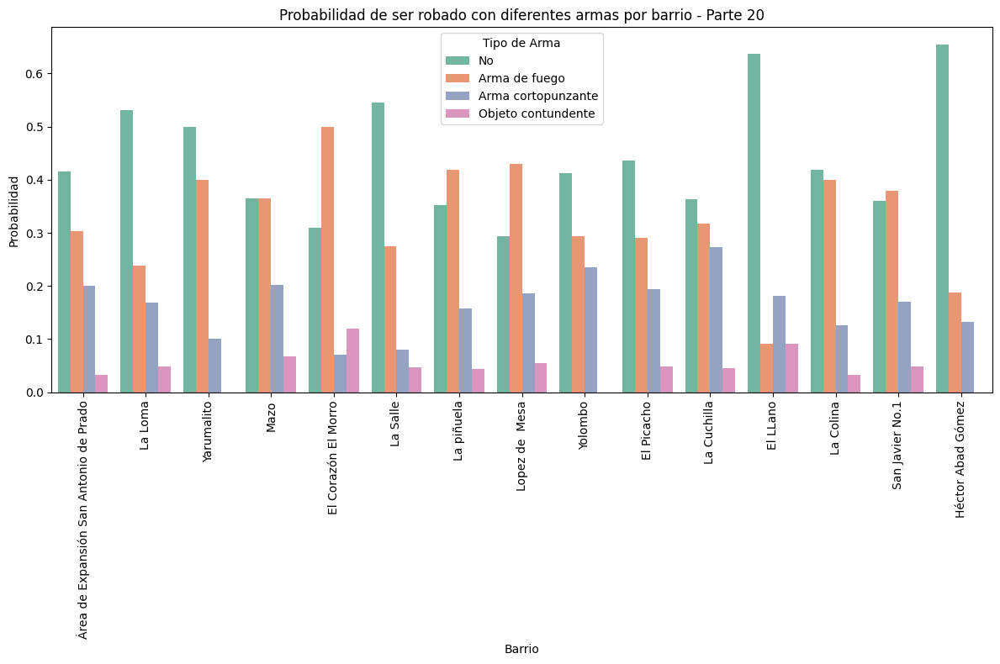

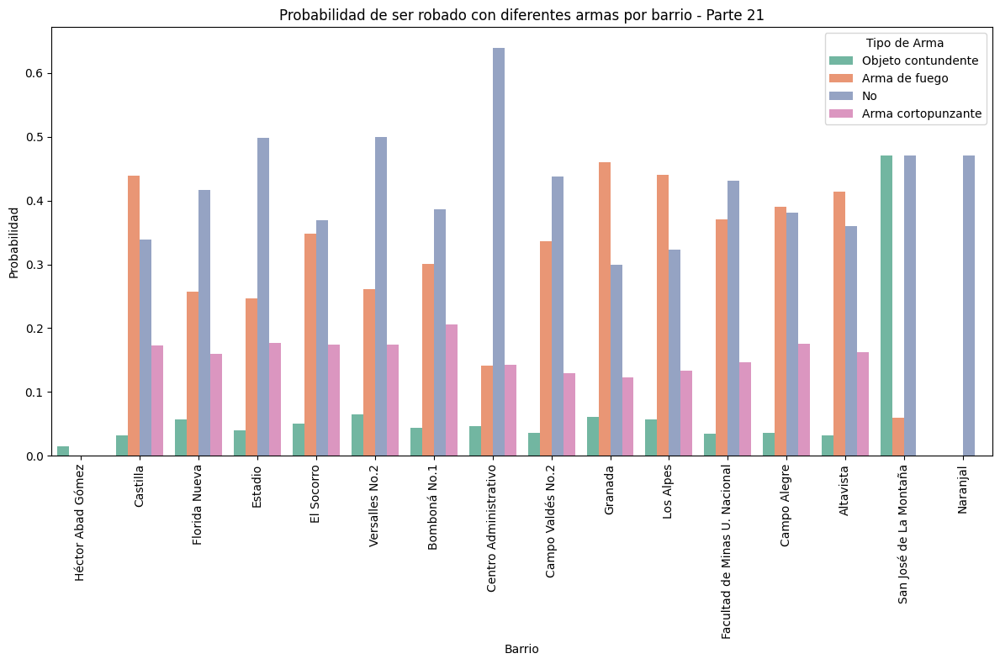

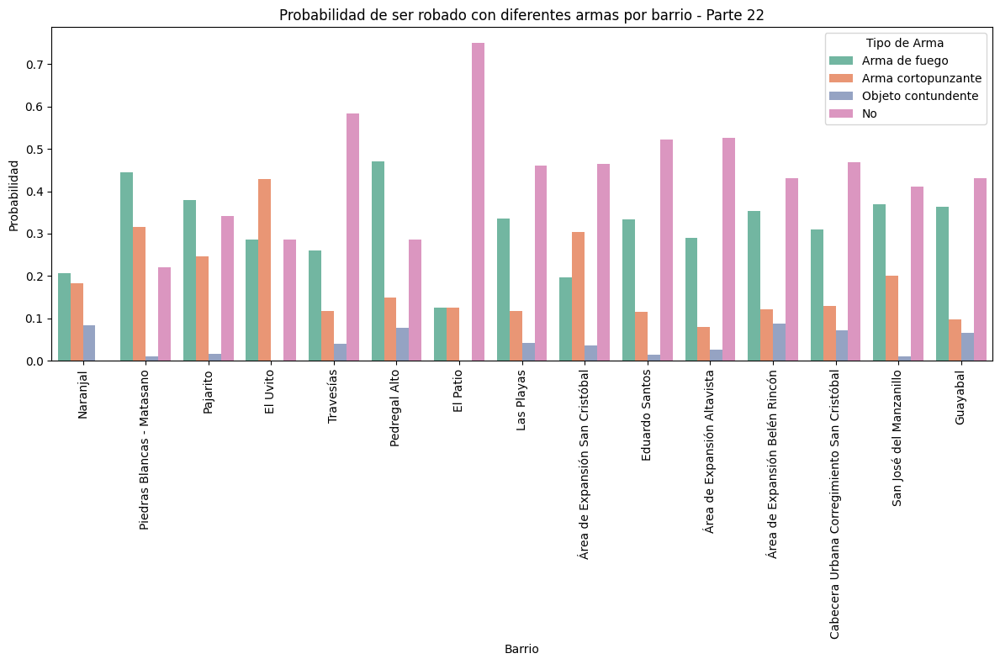

In [48]:
barrios_filtrados = barrios_probabilidades[(barrios_probabilidades['arma_medio'].isin(categorias_seleccionadas)) &
                                           (barrios_probabilidades['probabilidad'] != 1)]


n = 60
num_graficos = (len(barrios_filtrados) - 1) // n + 1

for i, df_grupo in enumerate(np.array_split(barrios_filtrados, num_graficos)):
    plt.figure(figsize=(12, 8))
    sns.barplot(x='NOMBRE', y='probabilidad', hue='arma_medio', data=df_grupo, palette='Set2')
    plt.xlabel('Barrio')
    plt.ylabel('Probabilidad')
    plt.title(f'Probabilidad de ser robado con diferentes armas por barrio - Parte {i+1}')
    plt.xticks(rotation=90)
    plt.legend(title='Tipo de Arma')
    plt.tight_layout()
    plt.show()

#¿Cómo visualizamos los 50 barrios con más hurtos y su probabilidad de ser robado?

Este bloque de código responde a la pregunta de cómo podemos visualizar los barrios de Medellín con la mayor cantidad de hurtos y, simultáneamente, mostrar la probabilidad de ser robado en esos barrios.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-49-c9e45985ed15>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(barrios_50['NOMBRE'], rotation=90)


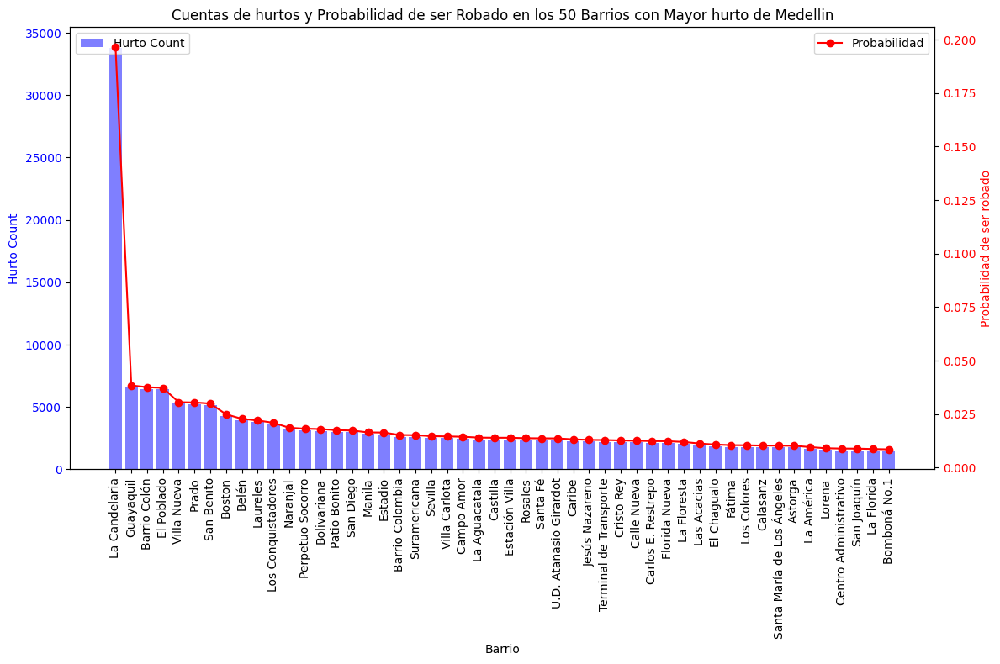

In [49]:
barrios_50 = barrios.sort_values(by='hurto_count', ascending=False).head(50)

total_hurtos = barrios_50['hurto_count'].sum()

barrios_50['probabilidad'] = barrios_50['hurto_count'] / total_hurtos

fig, ax1 = plt.subplots(figsize=(12, 8))

ax1.bar(barrios_50['NOMBRE'], barrios_50['hurto_count'], color='b', alpha=0.5, label='Hurto Count')
ax1.set_xlabel('Barrio')
ax1.set_ylabel('Hurto Count', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.set_xticklabels(barrios_50['NOMBRE'], rotation=90)

ax2 = ax1.twinx()
ax2.plot(barrios_50['NOMBRE'], barrios_50['probabilidad'], color='r', marker='o', label='Probabilidad')
ax2.set_ylabel('Probabilidad de ser robado', color='r')
ax2.tick_params(axis='y', labelcolor='r')

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.title('Cuentas de hurtos y Probabilidad de ser Robado en los 50 Barrios con Mayor hurto de Medellin')

plt.tight_layout()
plt.show()

como podemos observar el grueso de hurtos se encuentra en la candelaria lo que deja a los otros barrios con baja probabilidad de ocurrencia, por lo que se procedera a calcular estas probabilidades sin incluir este barrio

In [50]:
barrios_sin_candelaria = barrios[barrios['NOMBRE'] != "La Candelaria"]

total_hurtos_sin_candelaria = barrios_sin_candelaria['hurto_count'].sum()

barrios_sin_candelaria['probabilidad'] = barrios_sin_candelaria['hurto_count'] / total_hurtos_sin_candelaria


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-51-53fd7237455f>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(barrios_sin_candelaria['NOMBRE'], rotation=90)


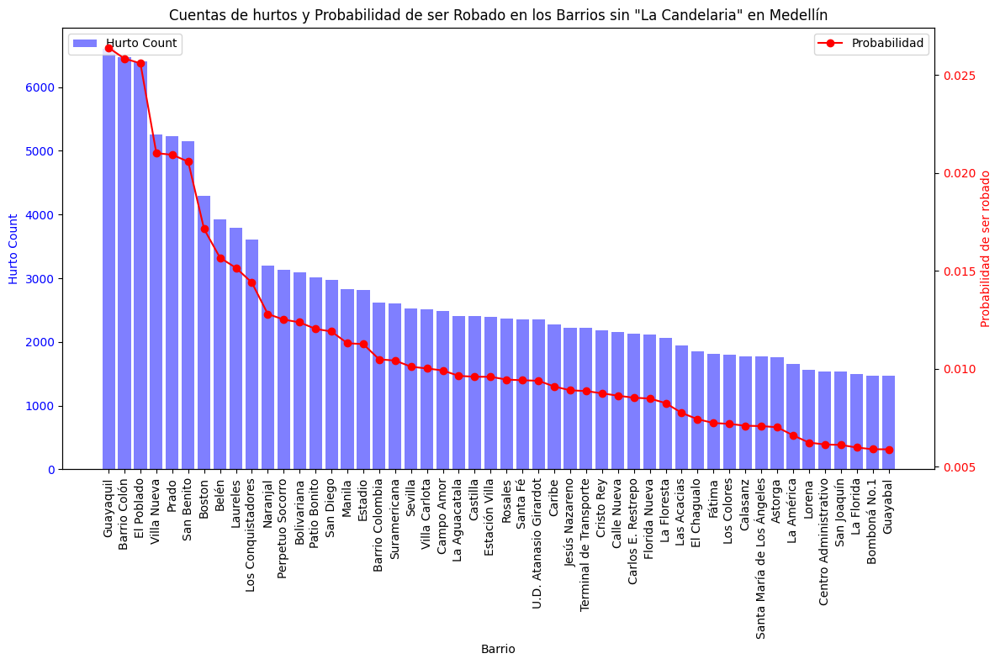

In [51]:
fig, ax1 = plt.subplots(figsize=(12, 8))

ax1.bar(barrios_sin_candelaria['NOMBRE'].head(50), barrios_sin_candelaria['hurto_count'].head(50), color='b', alpha=0.5, label='Hurto Count')
ax1.set_xlabel('Barrio')
ax1.set_ylabel('Hurto Count', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.set_xticklabels(barrios_sin_candelaria['NOMBRE'], rotation=90)

ax2 = ax1.twinx()
ax2.plot(barrios_sin_candelaria['NOMBRE'].head(50), barrios_sin_candelaria['probabilidad'].head(50), color='r', marker='o', label='Probabilidad')
ax2.set_ylabel('Probabilidad de ser robado', color='r')
ax2.tick_params(axis='y', labelcolor='r')

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.title('Cuentas de hurtos y Probabilidad de ser Robado en los Barrios sin "La Candelaria" en Medellín')

plt.tight_layout()
plt.show()

#¿Cómo podemos calcular las probabilidades de robo y la distribución de género en los robos en Medellín?

Para abordar esta pregunta, utilizamos probabilidades bayesianas para calcular la probabilidad de robo en cada barrio de Medellín, así como la probabilidad de que una persona robada sea hombre o mujer.

In [52]:
P_robo = hurto_barrios['NOMBRE'].value_counts(normalize=True)

P_hombre = (hurto_barrios['sexo'] == 'Hombre').mean()
P_mujer = (hurto_barrios['sexo'] == 'Mujer').mean()

print(f'Probabilidad de robo:\n{P_robo}\n')
print(f'Probabilidad de ser Hombre: {P_hombre:.2f}')
print(f'Probabilidad de ser Mujer: {P_mujer:.2f}')

Probabilidad de robo:
NOMBRE
La Candelaria                 0.118885
Guayaquil                     0.023253
Barrio Colón                  0.022760
El Poblado                    0.022552
Villa Nueva                   0.018510
                                ...   
La Ilusión                    0.000011
Volcana Guayabal              0.000004
La Suiza                      0.000004
Área de Expansión El Noral    0.000004
La Frisola                    0.000004
Name: proportion, Length: 314, dtype: float64

Probabilidad de ser Hombre: 0.58
Probabilidad de ser Mujer: 0.41


Para calcular las probabilidades de robo en cada barrio de Medellín, diferenciando si la persona robada es hombre o mujer, utilizamos probabilidades condicionales. Esto nos permite entender mejor la distribución de los robos por género en los diferentes barrios.

In [53]:

prob_cond_hombre = hurto_barrios[hurto_barrios['sexo'] == 'Hombre']['NOMBRE'].value_counts(normalize=True)


prob_cond_mujer = hurto_barrios[hurto_barrios['sexo'] == 'Mujer']['NOMBRE'].value_counts(normalize=True)


print(f'Probabilidad de robo dado que la persona es Hombre:\n{prob_cond_hombre}\n')
print(f'Probabilidad de robo dado que la persona es Mujer:\n{prob_cond_mujer}\n')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Probabilidad de robo dado que la persona es Hombre:
NOMBRE
La Candelaria       0.107137
El Poblado          0.023374
Villa Nueva         0.020540
San Benito          0.019948
Guayaquil           0.019918
                      ...   
La Ilusión          0.000018
El Astillero        0.000018
Volcana Guayabal    0.000006
La Suiza            0.000006
La Frisola          0.000006
Name: proportion, Length: 313, dtype: float64

Probabilidad de robo dado que la persona es Mujer:
NOMBRE
La Candelaria                 0.135532
Guayaquil                     0.027999
Barrio Colón                  0.027573
El Poblado                    0.021421
Prado                         0.017757
                                ...   
Boquerón                      0.000017
Buga Patio Bonito             0.000017
El Jardín                     0.000009
El Uvito                      0.000009
Área de Expansión El Noral    0.000009
Name: proportion, Length: 309, dtype: float64



#Ploteando estas probabilidades

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


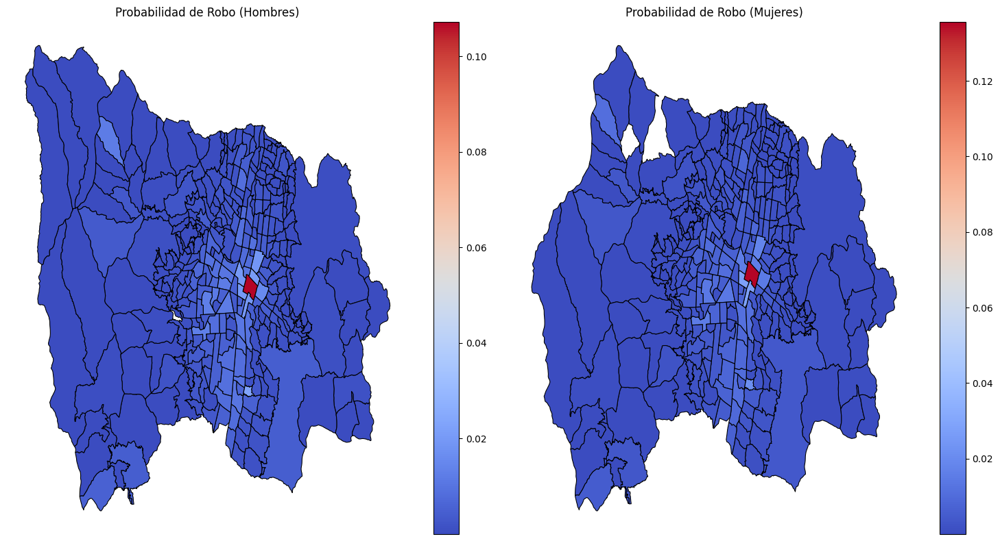

In [54]:
barrios['prob_cond_hombre'] = prob_cond_hombre.reindex(barrios['NOMBRE']).values
barrios['prob_cond_mujer'] = prob_cond_mujer.reindex(barrios['NOMBRE']).values

fig, axs = plt.subplots(1, 2, figsize=(15, 8))


axs[0].set_title('Probabilidad de Robo (Hombres)')
barrios.plot(column='prob_cond_hombre', cmap='coolwarm', linewidth=0.8, ax=axs[0], edgecolor='black', legend=True)


axs[1].set_title('Probabilidad de Robo (Mujeres)')
barrios.plot(column='prob_cond_mujer', cmap='coolwarm', linewidth=0.8, ax=axs[1], edgecolor='black', legend=True)


for ax in axs:
    ax.axis('off')
    ax.set_aspect('auto')

plt.tight_layout()
plt.show()

De la misma manera nos encontramos con el mismo problema, el barrio la candelaria no nos permite visualizar la informacion de manera correcta, por lo que se procede a hacer los mismo sin el

In [55]:
barrios_sin_candelaria['prob_cond_hombre'] = prob_cond_hombre.reindex(barrios_sin_candelaria['NOMBRE']).values
barrios_sin_candelaria['prob_cond_mujer'] = prob_cond_mujer.reindex(barrios_sin_candelaria['NOMBRE']).values

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


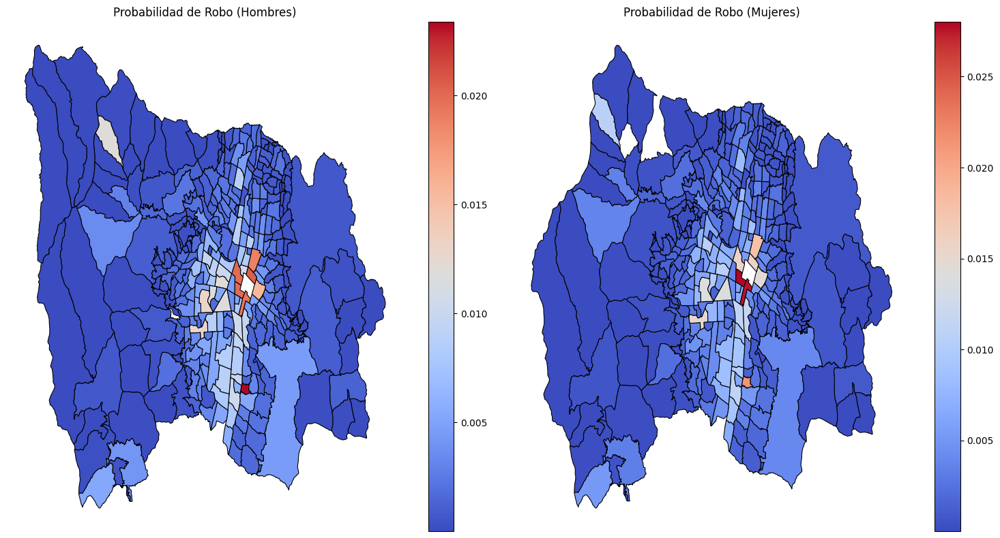

In [56]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[0].set_title('Probabilidad de Robo (Hombres)')
barrios_sin_candelaria.plot(column='prob_cond_hombre', cmap='coolwarm', linewidth=0.8, ax=axs[0], edgecolor='black', legend=True)


axs[1].set_title('Probabilidad de Robo (Mujeres)')
barrios_sin_candelaria.plot(column='prob_cond_mujer', cmap='coolwarm', linewidth=0.8, ax=axs[1], edgecolor='black', legend=True)

for ax in axs:
    ax.axis('off')
    ax.set_aspect('auto')

plt.tight_layout()
plt.show()

#¿Cómo se calcula la diferencia entre las probabilidades de robo para hombres y mujeres en cada barrio, excluyendo "La Candelaria"?

Para entender mejor cómo varía la probabilidad de robo entre hombres y mujeres en cada barrio (excluyendo "La Candelaria"), podemos calcular la diferencia entre estas probabilidades.

#Razones para Calcular esta Diferencia


*   Comparación de riesgos: Calcular esta diferencia nos permite comparar directamente el riesgo de robo entre hombres y mujeres en cada barrio.
*   Identificación de disparidades: Las diferencias significativas pueden señalar barrios donde un género específico es más vulnerable al robo.
*   Planificación de seguridad: Conocer estas diferencias puede ayudar a diseñar estrategias de seguridad más adecuadas para cada barrio.

#Interpretacion

**Diferencia positiva:** Si el valor de diferencia_prob es positivo, indica que la probabilidad de robo es mayor para los hombres en ese barrio.
**Diferencia negativa:** Si el valor de diferencia_prob es negativo, indica que la probabilidad de robo es mayor para las mujeres en ese barrio.
**Diferencia cercana a cero:** Si el valor es cercano a cero, sugiere que no hay una diferencia significativa en las probabilidades de robo entre hombres y mujeres en ese barrio.




In [57]:
barrios_sin_candelaria['diferencia_prob'] = barrios_sin_candelaria['prob_cond_hombre'] - barrios_sin_candelaria['prob_cond_mujer']

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


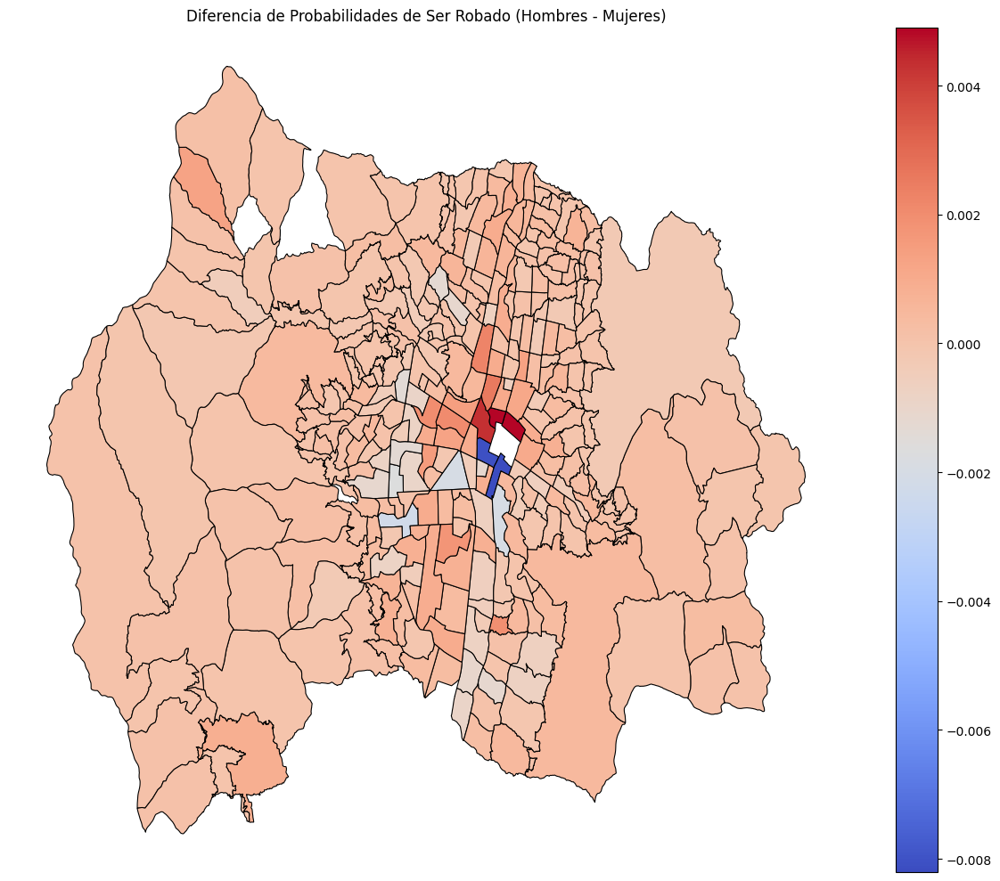

In [58]:

fig, ax = plt.subplots(figsize=(12, 10))

barrios_sin_candelaria.plot(column='diferencia_prob', cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='black', legend=True)


ax.set_title('Diferencia de Probabilidades de Ser Robado (Hombres - Mujeres)')
ax.axis('off')
ax.set_aspect('auto')

plt.tight_layout()
plt.show()

# Definición de Grupos de Edad y Asignación

Se definen rangos de edad y se asignan etiquetas correspondientes en un DataFrame de hurtos (hurto_barrios). Estos pasos permiten categorizar las edades en grupos específicos para un análisis más detallado.




In [59]:
bins = [0, 18, 30, 45, 60, 100]
labels = ['0-18', '19-30', '31-45', '46-60', '60+']

hurto_barrios['grupo_edad'] = pd.cut(hurto_barrios['edad'], bins=bins, labels=labels, right=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-60-941c1ff2a3c8>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=edad_counts.index, y=edad_counts.values, palette='viridis')


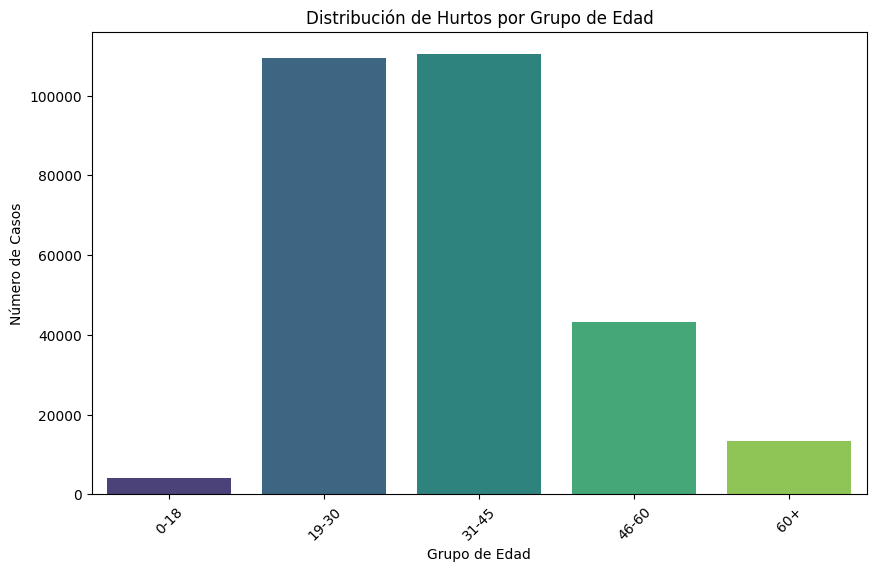

In [60]:
edad_counts = hurto_barrios['grupo_edad'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
sns.barplot(x=edad_counts.index, y=edad_counts.values, palette='viridis')
plt.title('Distribución de Hurtos por Grupo de Edad')
plt.xlabel('Grupo de Edad')
plt.ylabel('Número de Casos')
plt.xticks(rotation=45)
plt.show()

# Convertimos algunos dados en el formato adecuado, empezemos por la fecha del hecho

Pasar la columna fecha_hecho' en un formato de Datetime

In [61]:
hurto_barrios['fecha_hecho'] = pd.to_datetime(hurto_barrios['fecha_hecho'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [62]:
print(hurto_barrios['fecha_hecho'].dtypes)

datetime64[ns, UTC-05:00]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Obtener datos de la muestra por años

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


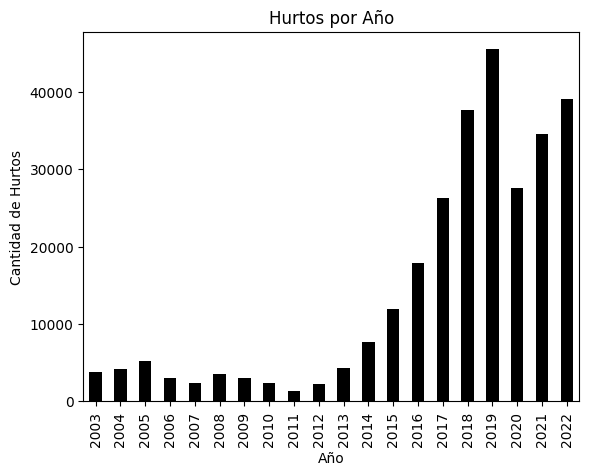

In [63]:
hurto_barrios['año_hecho'] = hurto_barrios['fecha_hecho'].dt.year


hurtos_por_año = hurto_barrios['año_hecho'].value_counts().sort_index()


hurtos_por_año.plot(kind='bar', title='Hurtos por Año', color = "black")
plt.xlabel('Año')
plt.ylabel('Cantidad de Hurtos')
plt.show()

# Ahora por Mes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


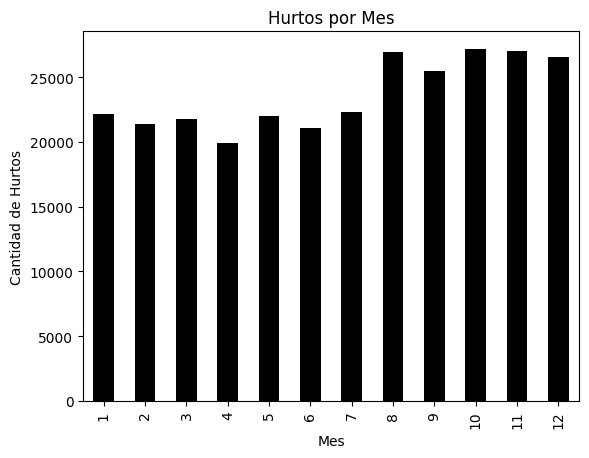

In [64]:
hurto_barrios['mes_hecho'] = hurto_barrios['fecha_hecho'].dt.month

hurtos_por_mes = hurto_barrios['mes_hecho'].value_counts().sort_index()


hurtos_por_mes.plot(kind='bar', title='Hurtos por Mes', color = "black")
plt.xlabel('Mes')
plt.ylabel('Cantidad de Hurtos')
plt.show()

# Por dia de la semana

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


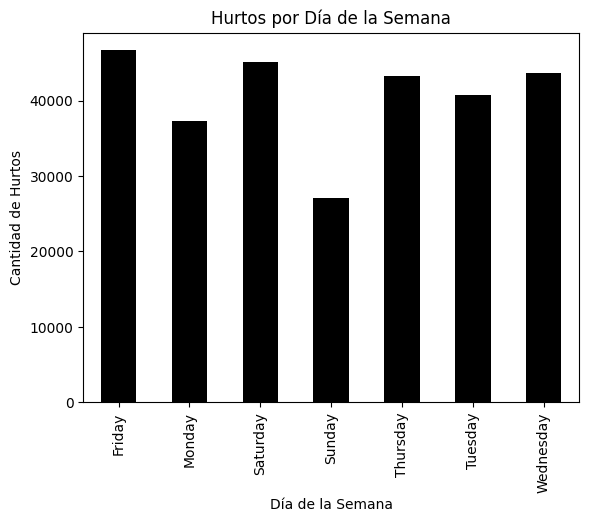

In [65]:
hurto_barrios['dia_semana_hecho'] = hurto_barrios['fecha_hecho'].dt.day_name()
hurtos_por_dia_semana = hurto_barrios['dia_semana_hecho'].value_counts().sort_index()


hurtos_por_dia_semana.plot(kind='bar', title='Hurtos por Día de la Semana', color = "black")
plt.xlabel('Día de la Semana')
plt.ylabel('Cantidad de Hurtos')
plt.show()

#Extraer informacion relevante

In [66]:
hurto_barrios['hora'] = hurto_barrios['fecha_hecho'].dt.hour
hurto_barrios['dia_semana'] = hurto_barrios['fecha_hecho'].dt.day_name()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [67]:
hurto_barrios['mes'] = hurto_barrios['fecha_hecho'].dt.month
hurto_por_mes = hurto_barrios.groupby('mes').size()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#Plot de robos por mes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


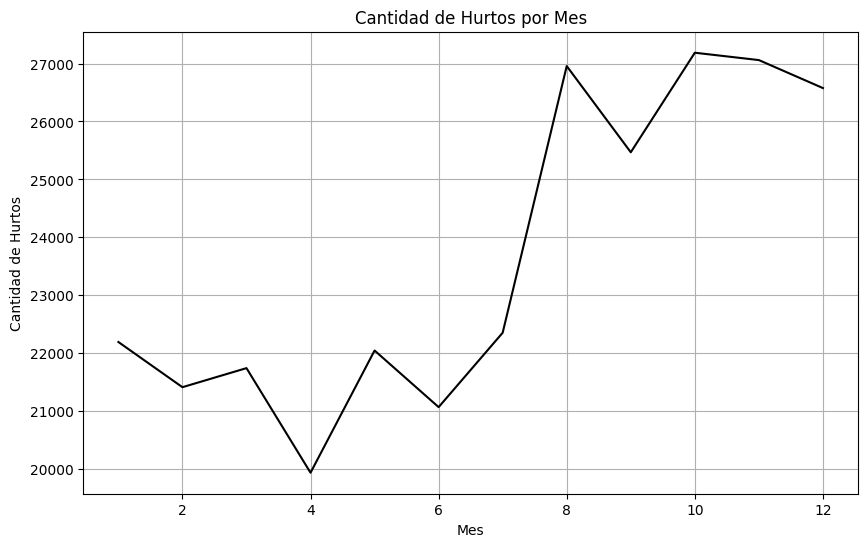

In [68]:

hurto_por_mes.plot(kind='line', figsize=(10, 6), color = "black")
plt.title('Cantidad de Hurtos por Mes')
plt.xlabel('Mes')
plt.ylabel('Cantidad de Hurtos')
plt.grid(True)
plt.show()

#Plot de hurtos por hora

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


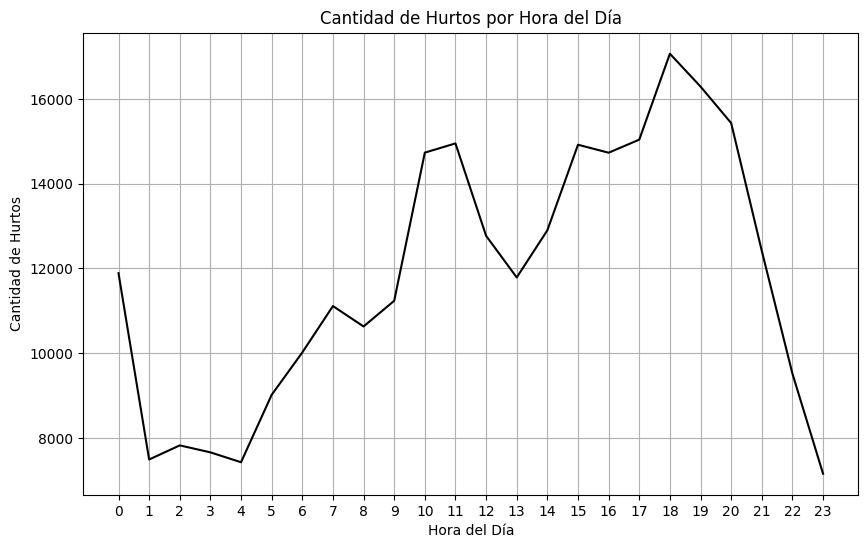

In [69]:
hurtos_por_hora = hurto_barrios.groupby('hora')['cantidad'].sum()


plt.figure(figsize=(10, 6))
plt.plot(hurtos_por_hora.index, hurtos_por_hora.values, linestyle='-', color='black')
plt.title('Cantidad de Hurtos por Hora del Día')
plt.xlabel('Hora del Día')
plt.ylabel('Cantidad de Hurtos')
plt.xticks(range(24))
plt.grid(True)
plt.show()

#Dia del mes

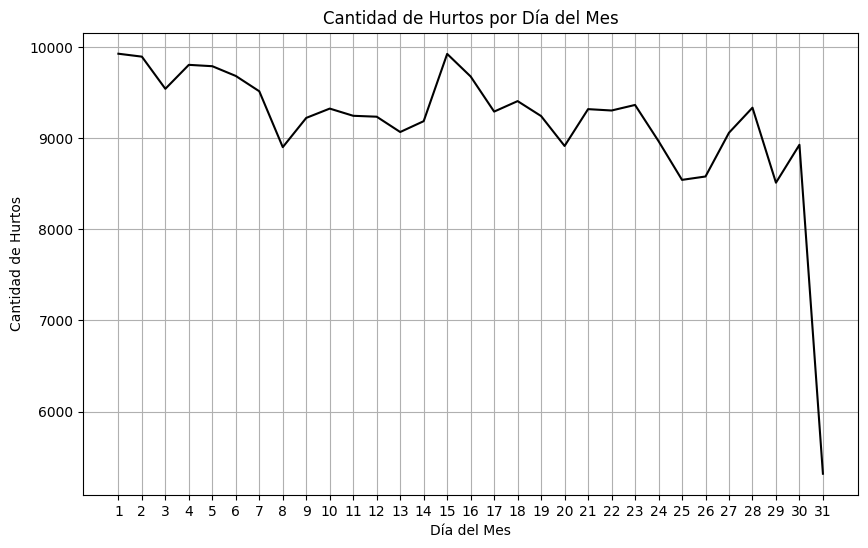

In [70]:
hurto_barrios['dia_mes'] = hurto_barrios['fecha_hecho'].dt.day
hurtos_por_dia_mes = hurto_barrios.groupby('dia_mes')['cantidad'].sum()

plt.figure(figsize=(10, 6))
plt.plot(hurtos_por_dia_mes.index, hurtos_por_dia_mes.values, linestyle='-', color='black')
plt.title('Cantidad de Hurtos por Día del Mes')
plt.xlabel('Día del Mes')
plt.ylabel('Cantidad de Hurtos')
plt.xticks(range(1, 32))
plt.grid(True)
plt.show()

# Serie de tiempo hurtos en medellin

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-71-fe9ca0f05947>:1: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  hurto_barrios['mes_año'] = hurto_barrios['fecha_hecho'].dt.to_period('M')
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.fi

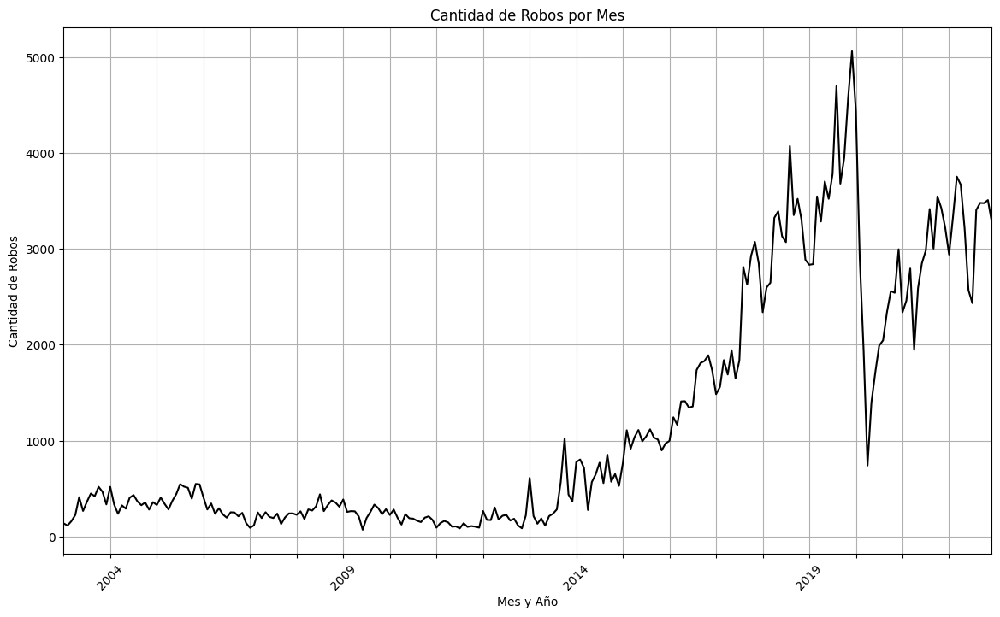

In [71]:
hurto_barrios['mes_año'] = hurto_barrios['fecha_hecho'].dt.to_period('M')

robos_por_mes = hurto_barrios['mes_año'].value_counts().sort_index()

plt.figure(figsize=(14, 8))
robos_por_mes.plot(kind='line', color='black')
plt.title('Cantidad de Robos por Mes')
plt.xlabel('Mes y Año')
plt.ylabel('Cantidad de Robos')
plt.grid(True)
plt.xticks(rotation=45)
years = pd.date_range(start=hurto_barrios['fecha_hecho'].min(), end=hurto_barrios['fecha_hecho'].max(), freq='YS').strftime('%Y')
plt.xticks(years)



plt.show()

# Mapa de hora promedio de robo en Medellin

In [72]:
hora_promedio_por_barrio = hurto_barrios.groupby('NOMBRE')['hora'].mean()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [73]:
barrios = pd.merge(barrios, hora_promedio_por_barrio, on='NOMBRE')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


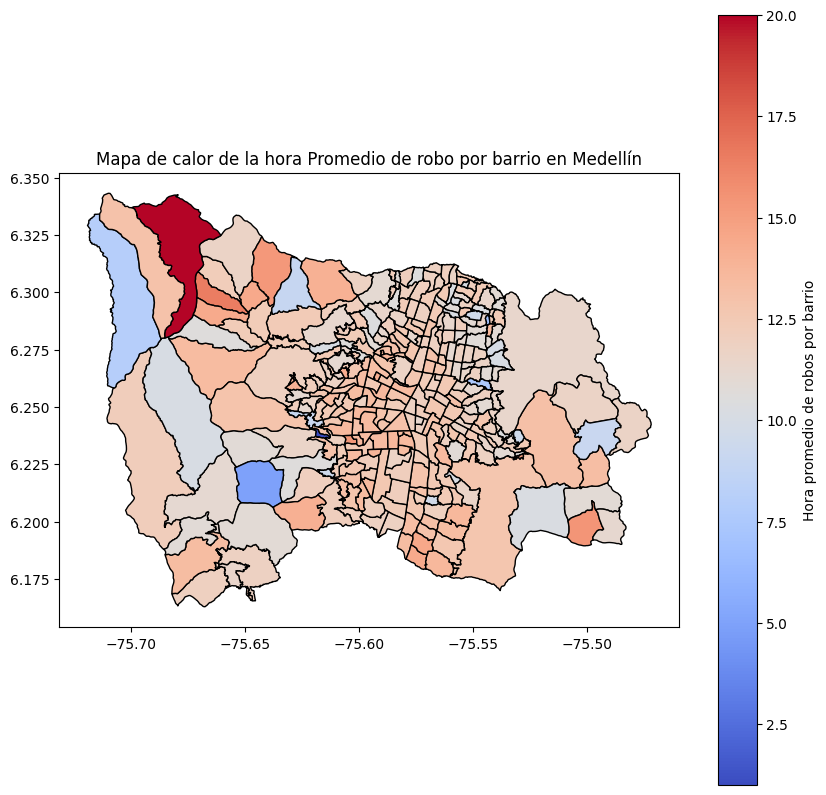

In [74]:
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(ax=ax, edgecolor='black', cmap='coolwarm', legend=True, column='hora',
             legend_kwds={'label': "Hora promedio de robos por barrio", 'orientation': "vertical"})

plt.title('Mapa de calor de la hora Promedio de robo por barrio en Medellín')
plt.show()